# Single-cell RNA-seq analysis code for Cell Lines 2 & 3

<b>Table of contents:</b>
<ol>
  <li><a href=#Setup>Setup</a></li>
  <li><a href=#Load-data>Load data</a></li>
  <li><a href=#QC>QC</a></li>
  <li><a href=#Cell-Line-2-(FOK4)>Cell Line 2 (FOK4)</a></li>
  <ol>
    <li><a href=#CL2-Preprocess-Data>CL2 Preprocess Data</a></li>
    <li><a href=#CL2-Data-overview>CL2 Data overview</a></li>
    <li><a href=#CL2-DE-analysis>CL2 DE analysis</a></li>
    <li><a href=#CL2-Enrichment-analysis>CL2 Enrichment analysis</a></li>
    <ol>
      <li><a href=#CL2-Crossdisorder>CL2 Crossdisorder</a></li>
      <li><a href=#CL2-Intellectual-Disability>CL2 Intellectual Disability</a></li>
      <li><a href=#CL2-Permutation-Tests>CL2 Permutation Tests</a></li>
    </ol>
  </ol>
  <li><a href=#Cell-Line-3-(HPS0076)>Cell Line 3 (HPS0076)</a></li>
  <ol>
    <li><a href=#CL3-Preprocess-Data>CL3 Preprocess Data</a></li>
    <li><a href=#CL3-Data-overview>CL3 Data overview</a></li>
    <li><a href=#CL3-DE-analysis>CL3 DE analysis</a></li>
    <li><a href=#CL3-Enrichment-analysis>CL3 Enrichment analysis</a></li>
    <ol>
      <li><a href=#CL3-Crossdisorder>CL3 Crossdisorder</a></li>
      <li><a href=#CL3-Intellectual-Disability>CL3 Intellectual Disability</a></li>
      <li><a href=#CL3-Permutation-Tests>CL3 Permutation Tests</a></li>
    </ol>
  </ol>
</ol>
<br>
<b>Publication figures produced in this notebook:</b>
<ul>
  <li>Figure 5</li>
    <ul>
      <li><a href=#fig5b>5b</a></li>
      <li><a href=#fig5c>5c</a></li>
    </ul>
</ul>

<ul>
  <li>Supplementary Figure 9</li>
    <ul>
      <li><a href=#suppfig9b>9b</a></li>
      <li><a href=#suppfig9c>9c</a></li>

# Setup

In [1]:
import os
import sys
import gzip
import tarfile

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels
import scipy.io
import diffxpy.api as de
import scanpy as sc
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri

/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/opt/python/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:34: UserWarning: pandas >= 1.0 is not supported.
  warnings.warn('pandas >= 1.0 is not supported.')


In [2]:
pandas2ri.activate()
%load_ext rpy2.ipython
%matplotlib inline
%config InlineBackend.figure_formats = ['retina']
sns.set(style="whitegrid")
sc.settings.verbosity = 3  
sc.settings.n_jobs = 8
sc.settings.set_figure_params(dpi=200, dpi_save=300)

print(sys.version)
sc.logging.print_versions()

3.7.7 (default, Apr 10 2020, 15:22:44) 
[GCC 8.3.0]
scanpy==1.4.6 anndata==0.7.1 umap==0.4.0 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


In [3]:
%%R
library(scran)
library(MAST)

R[write to console]: Loading required package: SingleCellExperiment

R[write to console]: Loading required package: SummarizedExperiment

R[write to console]: Loading required package: GenomicRanges

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find

In [4]:
def mast_de_groups(adata, groupby, save):
    '''Compute differential expression with the MAST package by treatment covariate within clusters provided as "groupby" and export as excel file'''
    
    # Define R function to run MAST analysis
    robjects.r('''
        mast_de_r <- function(data_mat, obs, var, clusters, groupby){
            #Prepare data sets for SingleCellExperiment data structure conversion
            obs['wellKey'] = row.names(obs)
            var['primerid'] = row.names(var)

            #Convert to SingleCellExperiment type
            sca <- FromMatrix(exprsArray=data_mat, cData=obs, fData=var)

            #Compute Gene detection rate
            cdr <- colSums(assay(sca)>0)
            colData(sca)$ngeneson = scale(cdr)

            #Create a vector that will hold all the DE results
            output <- vector("list", length(clusters))

            count <- 0

            #Loop over all louvain clusters
            for (i in clusters){
                count <- count+1
                
                #Create data subsets which should be used for testing
                sca_sub <- subset(sca, with(colData(sca), louvain_three==i))


                #Filter out non-expressed genes in the subset
                sca_sub <- sca_sub[rowSums(assay(sca_sub)) != 0, ]

                #Define & run hurdle model
                zlmCond <- zlm(formula = ~treatment + ngeneson, sca=sca_sub)
                summaryCond <- summary(zlmCond, doLRT='treatmentVeh')

                summaryDt <- summaryCond$datatable

                result <- merge(summaryDt[contrast=='treatmentVeh' & component=='H',.(primerid, `Pr(>Chisq)`)], #p-vals
                                 summaryDt[contrast=='treatmentVeh' & component=='logFC', .(primerid, coef)], #logFC coefficients
                                 by='primerid') 

                #Correct for multiple testing (FDR correction) and filtering
                result[,FDR:=p.adjust(`Pr(>Chisq)`, 'fdr')]
                result[,coef:=result[,coef]/log(2)]
                names(result) <- c("gene", "pval", "log2FC", "qval")
                result = result[order(result$qval),]

                output[[count]] <- result

            }
            return(output)
        }
    ''')
    
    mast_de = robjects.globalenv['mast_de_r']
    

    data_mat = adata.X.A.T
    obs = adata.obs
    var = adata.var
    clusters = list(adata.obs[groupby].cat.categories)
    
    expr_dict = {adata.var.index[i]:{} for i in range(adata.shape[1])}
    for clust in adata.obs[groupby].cat.categories:
        expr = adata[adata.obs[groupby] == clust].X.A.mean(axis=0)
        for i, gene in enumerate(adata.var.index):
            expr_dict[gene][clust] = expr[i]
    
    result = mast_de(data_mat, obs, var, clusters, groupby)
    result = {clusters[i]:datframe for i, datframe in enumerate(result)}
    
    writer = pd.ExcelWriter(save, engine='xlsxwriter')
    print('Number of significant DE genes:')    
    for clust in clusters:
        result[clust]['meanExpr'] = [expr_dict[gene][clust] for gene in result[clust]['gene'].values]
        result[clust].to_excel(writer,sheet_name=str(clust))
        print(clust+':', np.sum([result[clust]['qval']<0.05]))

    writer.save()

    return

In [5]:
# create directories for saving outputs
for d in ["differential_expression", "enrichment", "figures"]:
    if not os.path.exists(d):
        os.makedirs(d)

# Load data

In [6]:
# Download cell line 2 and 3 raw data from GEO
!curl -o ./GSE189534_RAW.tar https://ftp.ncbi.nlm.nih.gov/geo/series/GSE189nnn/GSE189534/suppl/GSE189534_RAW.tar

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  409M  100  409M    0     0  21.4M      0  0:00:19  0:00:19 --:--:-- 27.9M


In [7]:
# Read data from tar file into anndata object
adatas = []
with tarfile.open("./GSE189534_RAW.tar") as tar:
    for member in tar.getmembers():
        if member.name.endswith("-matrix.mtx.gz"):
            basename = member.name.split("-matrix.mtx.gz")[0]
            print(f"Reading sample: {basename}")
            geo_sample_id, sample_id = basename.split("_")
            sample_id_list = sample_id.split("-")
            sample_id_list = ["HPS0076"] + sample_id_list if len(sample_id_list) == 4 else sample_id_list

            with gzip.open(tar.extractfile(member), 'rb') as mm:
                x = scipy.io.mmread(mm).T.tocsr()
            obs = pd.read_csv(tar.extractfile(basename + '-barcodes.tsv.gz'), compression='gzip', header=None, sep='\t', index_col=0)
            obs.index.name = None
            obs["cellline"] = sample_id_list[0]
            obs["day"] = sample_id_list[1]
            obs["treatment"] = sample_id_list[3]
            obs["sample"] = "-".join(sample_id_list[:2] + sample_id_list[3:])
            obs["GEO_sample_ID"] = geo_sample_id
            var = pd.read_csv(tar.extractfile(basename + '-features.tsv.gz'), compression='gzip', header=None, sep='\t').iloc[:, :2]
            var.columns = ['ensembl_id', 'gene_name']
            var.index = var['gene_name'].values
            adata = sc.AnnData(X=x, obs=obs, var=var)
            adata.var_names_make_unique()
            adatas.append(adata)
adata = adatas[0].concatenate(adatas[1:])
del adatas

Reading sample: GSM5703303_FOK4-D90-Veh-Acu-C1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703304_FOK4-D90-Veh-Acu-C2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703305_FOK4-D90-Veh-Acu-V1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703306_FOK4-D90-Veh-Acu-V2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703307_FOK4-D90-Veh-Veh-C1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703308_FOK4-D90-Veh-Veh-C2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703309_FOK4-D90-Veh-Veh-V1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703310_FOK4-D90-Veh-Veh-V2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703311_D90-Veh-Acu-C1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703312_D90-Veh-Acu-C2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703313_D90-Veh-Acu-V1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703314_D90-Veh-Acu-V2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703315_D90-Veh-Veh-C1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703316_D90-Veh-Veh-C2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703317_D90-Veh-Veh-V1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Reading sample: GSM5703318_D90-Veh-Veh-V2


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [8]:
# Add annotation
annot = pd.read_csv('./cell_annotations.csv', index_col=0)
louvain_three = []
for index, row in adata.obs.iterrows():
    annotation = annot.loc[index]
    assert annotation["sample"] == row["sample"]
    louvain_three.append(annotation["louvain_three"])
adata.obs["louvain_three"] = louvain_three
adata.obs["louvain_three"] = adata.obs["louvain_three"].astype('category')
adata.obs["louvain_three"] = adata.obs["louvain_three"].cat.reorder_categories(['Non-Neural Progenitors', 'Neural Progenitors', 'Neurons', "unassigned"])

# QC

In [9]:
adata.var['mito'] = [symb.startswith('MT-') for symb in adata.var.index]
sc.pp.calculate_qc_metrics(adata, qc_vars=(['mito']), inplace=True)

... storing 'GEO_sample_ID' as categorical
... storing 'cellline' as categorical
... storing 'day' as categorical
... storing 'sample' as categorical
... storing 'treatment' as categorical
... storing 'gene_name' as categorical


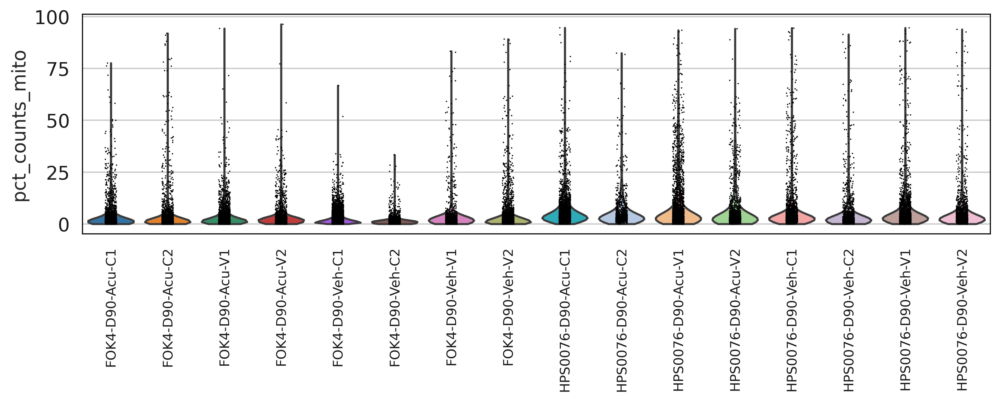

In [10]:
with plt.rc_context({"xtick.labelsize": 10, "figure.figsize": (10,3)}):
    sc.pl.violin(adata, 'pct_counts_mito', cut=0, groupby='sample', rotation=90)

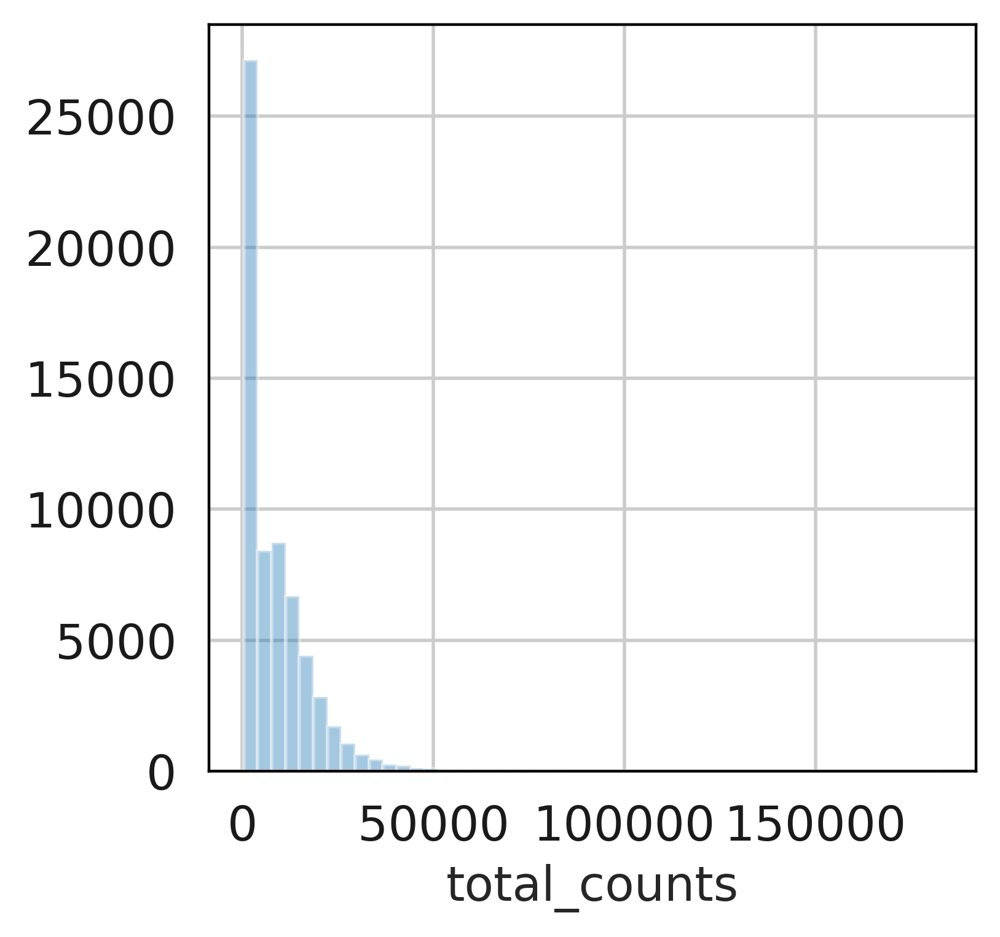

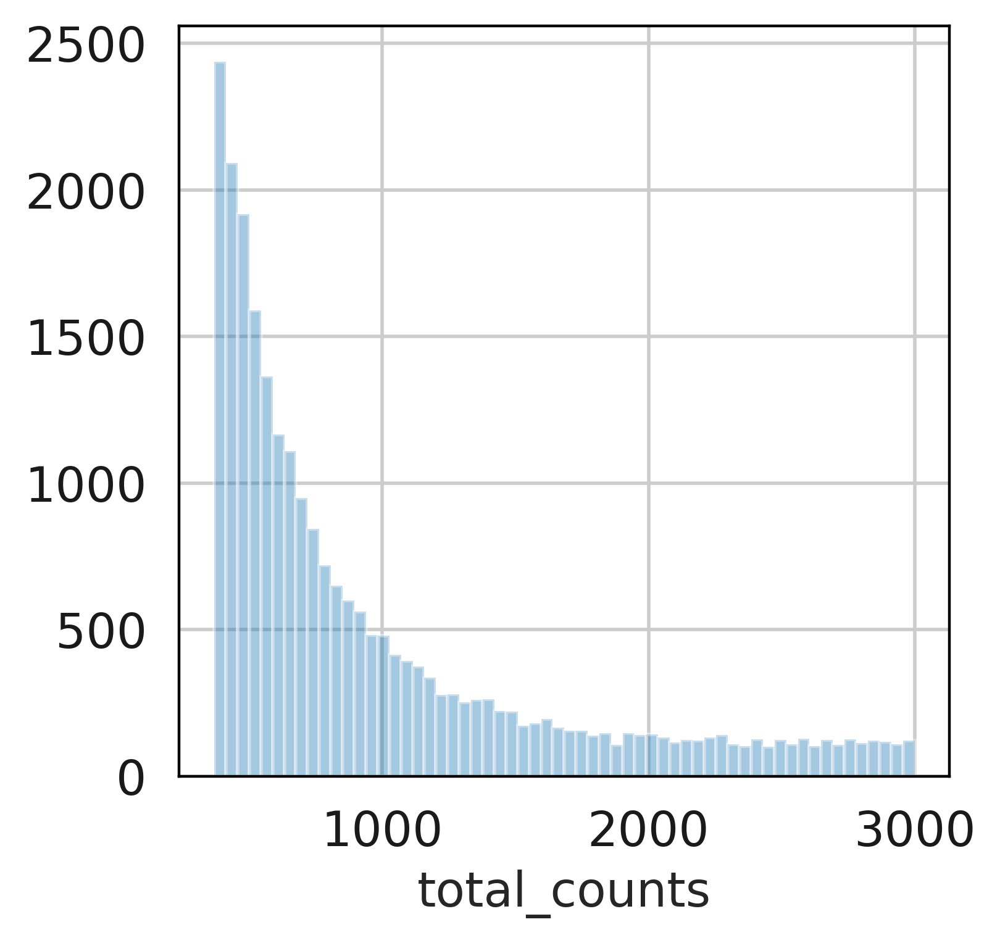

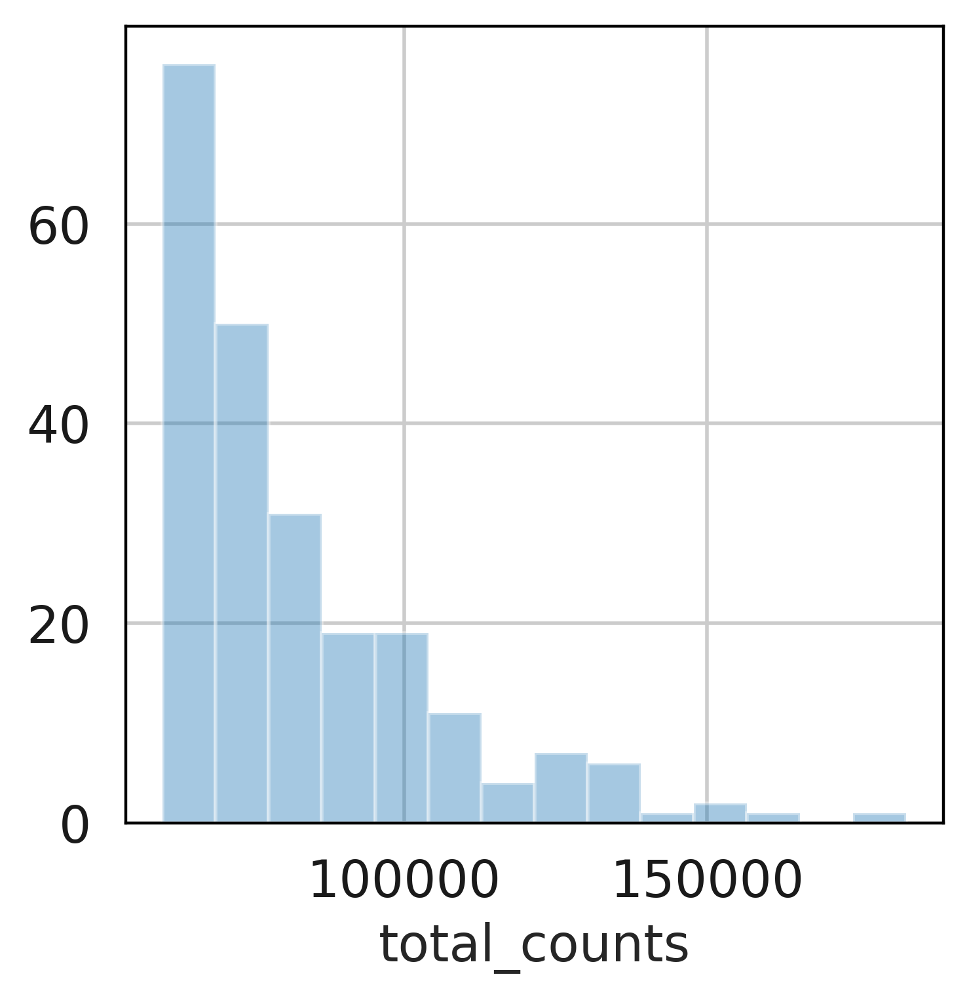

In [11]:
# Thresholding decision: counts
sns.distplot(adata.obs['total_counts'], kde=False)
plt.show()

sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']<3000], kde=False, bins=60)
plt.show()

sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']>60000], kde=False)
plt.show()

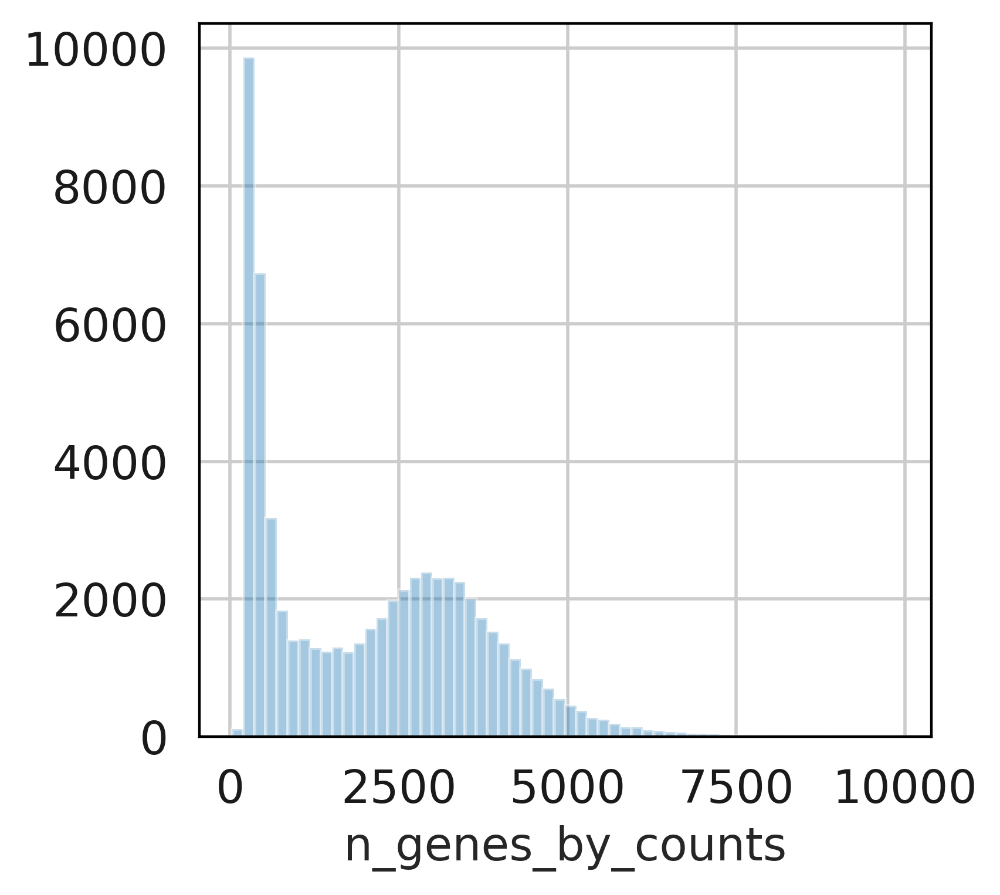

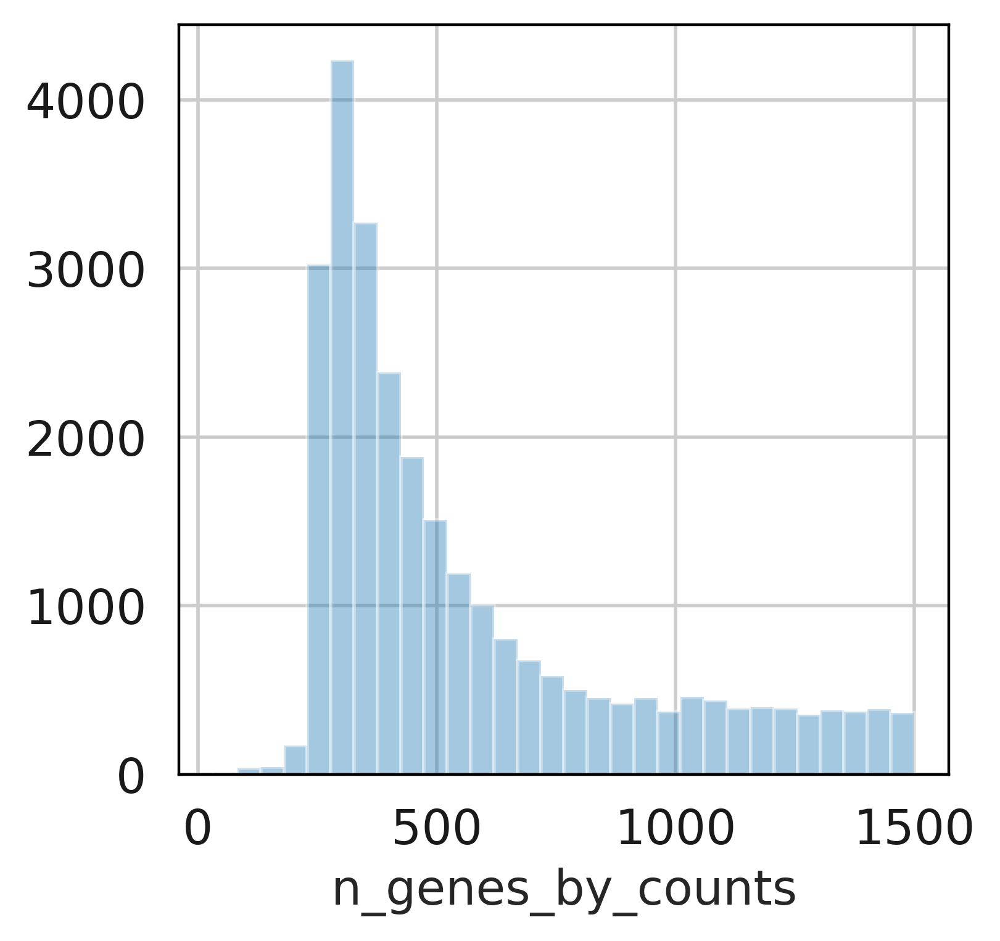

In [12]:
# Thresholding decision: genes
sns.distplot(adata.obs['n_genes_by_counts'], kde=False, bins=60)
plt.show()
sns.distplot(adata.obs['n_genes_by_counts'][adata.obs['n_genes_by_counts']<1500], kde=False, bins=30)
plt.show()

In [13]:
# Filter cells according to identified QC thresholds:
print('Total number of cells before filtering: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 1200)
sc.pp.filter_cells(adata, min_genes = 700)
sc.pp.filter_cells(adata, max_counts = 150000)

mito_thresh = 25.0
n1 = adata.n_obs
adata = adata[adata.obs['pct_counts_mito'] < mito_thresh]
print('filtered out {:d} cells that have more than or equal to {:d}% mitochondrial counts'.format((n1 - adata.n_obs), int(mito_thresh)))
del n1, mito_thresh

print('Total number of cells after filtering: {:d}'.format(adata.n_obs))

Total number of cells before filtering: 63052
filtered out 18451 cells that have less than 1200 counts
filtered out 1661 cells that have less than 700 genes expressed
filtered out 3 cells that have more than 150000 counts
filtered out 414 cells that have more than or equal to 25% mitochondrial counts
Total number of cells after filtering: 42523


In [14]:
# Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 58735
filtered out 32026 genes that are detected in less than 20 cells


Trying to set attribute `.var` of view, copying.


Number of genes after cell filter: 26709


In [15]:
# Recalculate qc metrics
del adata.obs['n_counts']
del adata.var['n_cells']
sc.pp.calculate_qc_metrics(adata, qc_vars=(['mito']), inplace=True)

# Cell Line 2 (FOK4)

## CL2 Preprocess Data

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA with n_comps = 50
    finished (0:00:18)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:09)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 19 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:03)


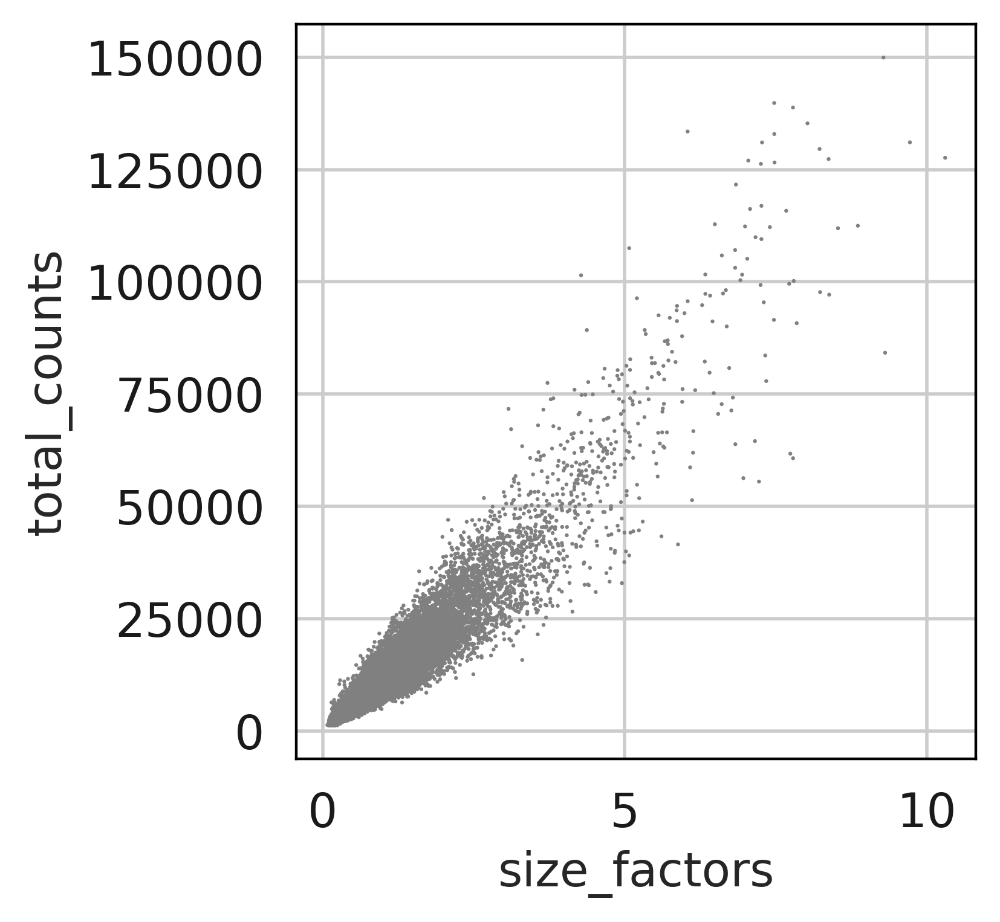

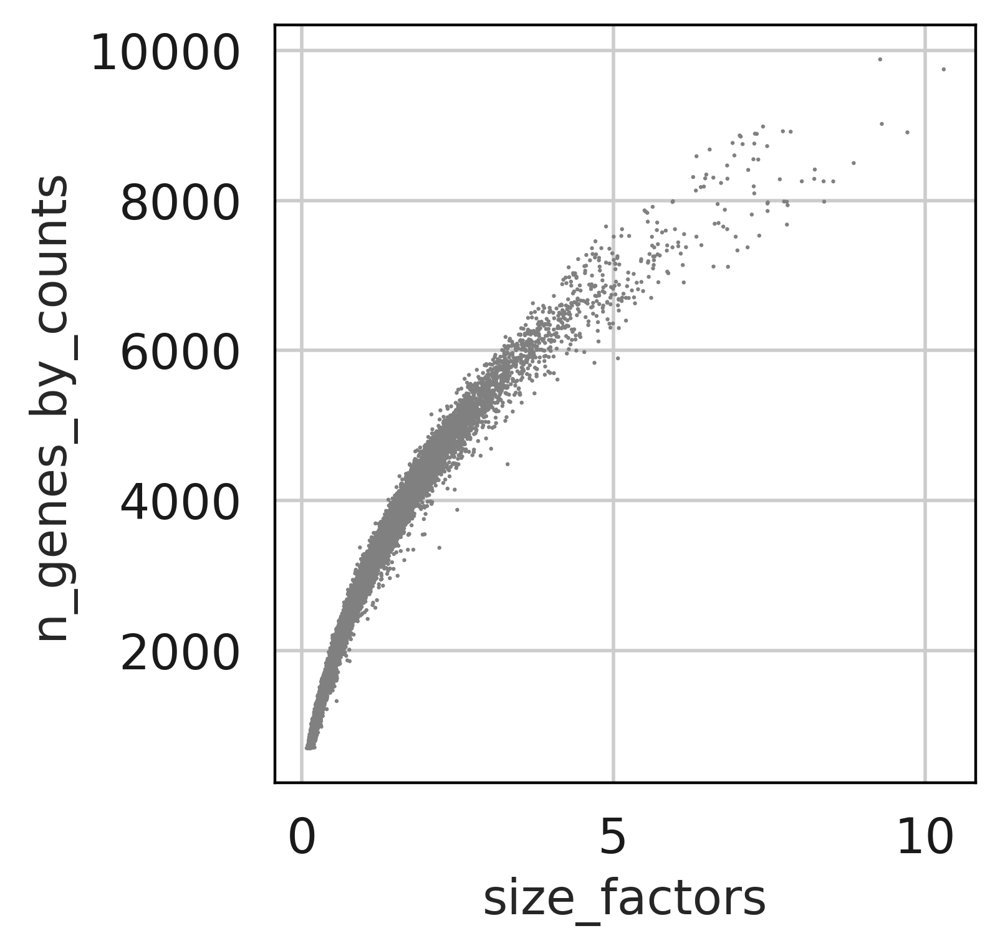

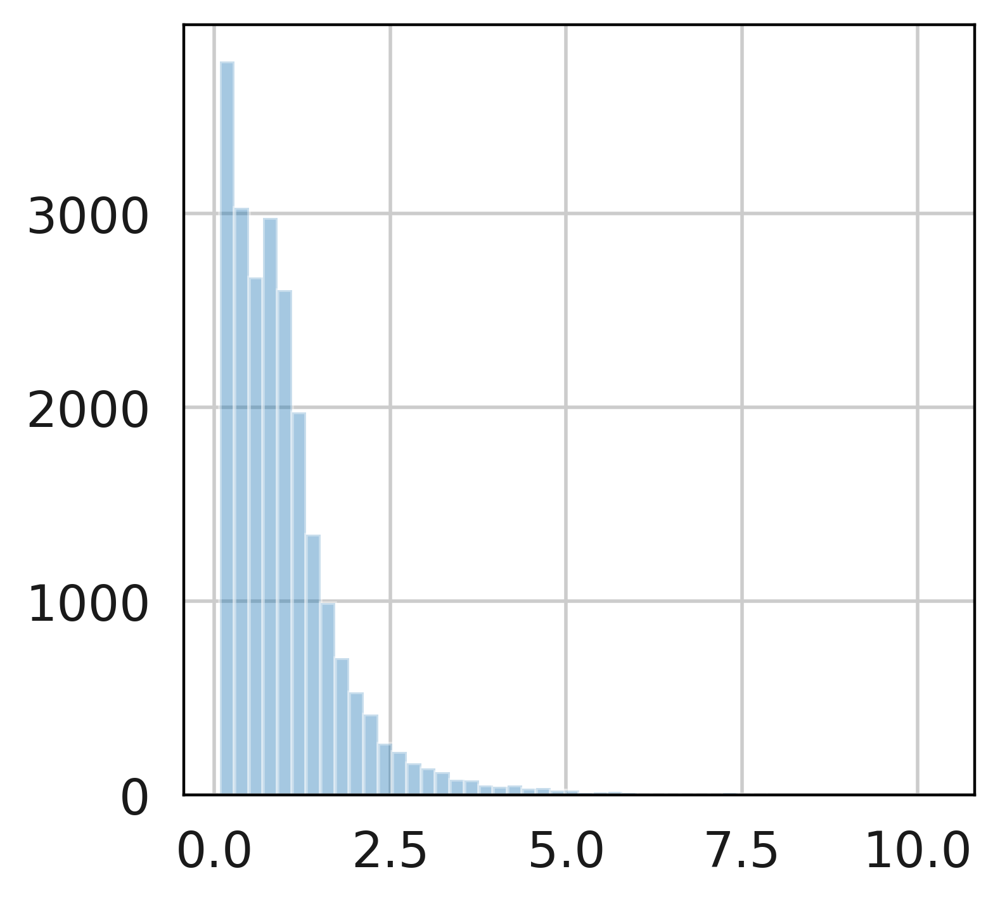

In [16]:
# Create object for Cell Line 2
adata_fok = adata[adata.obs["cellline"] == "FOK4"].copy()
adata_fok = adata_fok[adata_fok.obs["louvain_three"] != "unassigned"].copy()
adata_fok.obs["louvain_three"] = adata_fok.obs["louvain_three"].cat.remove_unused_categories()
fok_clusters_three = list(adata_fok.obs['louvain_three'].cat.categories)

# Densify adata
adata_fok.layers["counts"] = adata_fok.X.copy()
adata_fok.X = adata_fok.X.A

# Perform a clustering for improved scran normalization in clusters
adata_pp = adata_fok.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

# Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = np.array(adata_fok.X.T)
del adata_pp

# Run scran
%R -i input_groups -i data_mat -o size_factors size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

# Visualize the estimated size factors
adata_fok.obs['size_factors'] = size_factors
sc.pl.scatter(adata_fok, 'size_factors', 'total_counts')
sc.pl.scatter(adata_fok, 'size_factors', 'n_genes_by_counts')
sns.distplot(size_factors, bins=50, kde=False)
plt.show()

del data_mat, input_groups

In [17]:
# LogNormalize adata 
adata_fok.X /= adata_fok.obs['size_factors'].values[:,None]
sc.pp.log1p(adata_fok)

# Keep normalised data in seperate layer
adata_fok.layers["scran"] = scipy.sparse.csr_matrix(adata_fok.X).copy()

# Check dropout
print("Dropout:", np.sum(adata_fok.X == 0)/np.size(adata_fok.X))

# Annotate highly variable genes
sc.pp.highly_variable_genes(adata_fok, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_fok.var['highly_variable'])))
adata_fok.X = scipy.sparse.csr_matrix(adata_fok.X)

Dropout: 0.8994879999661861
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


In [18]:
sc.pp.pca(adata_fok)
sc.pp.neighbors(adata_fok)
sc.tl.umap(adata_fok)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


## CL2 Data overview

**Figure 5b:**
<a id="fig5b"></a>

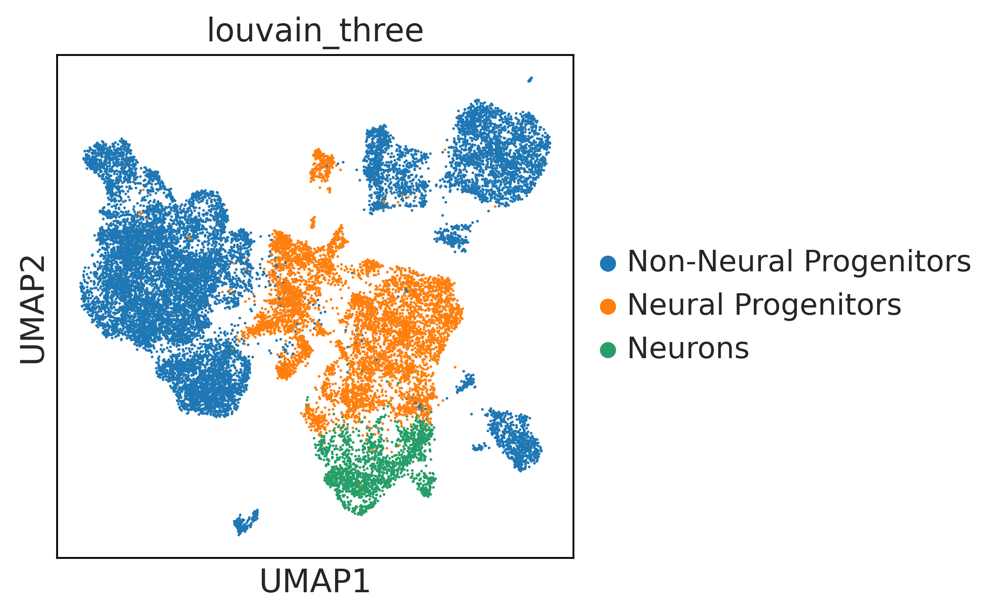

In [19]:
sc.pl.umap(adata_fok, color='louvain_three', save='_fok_threegroups.png')

**Supplementary Figure 9b:**
<a id="suppfig9b"></a>

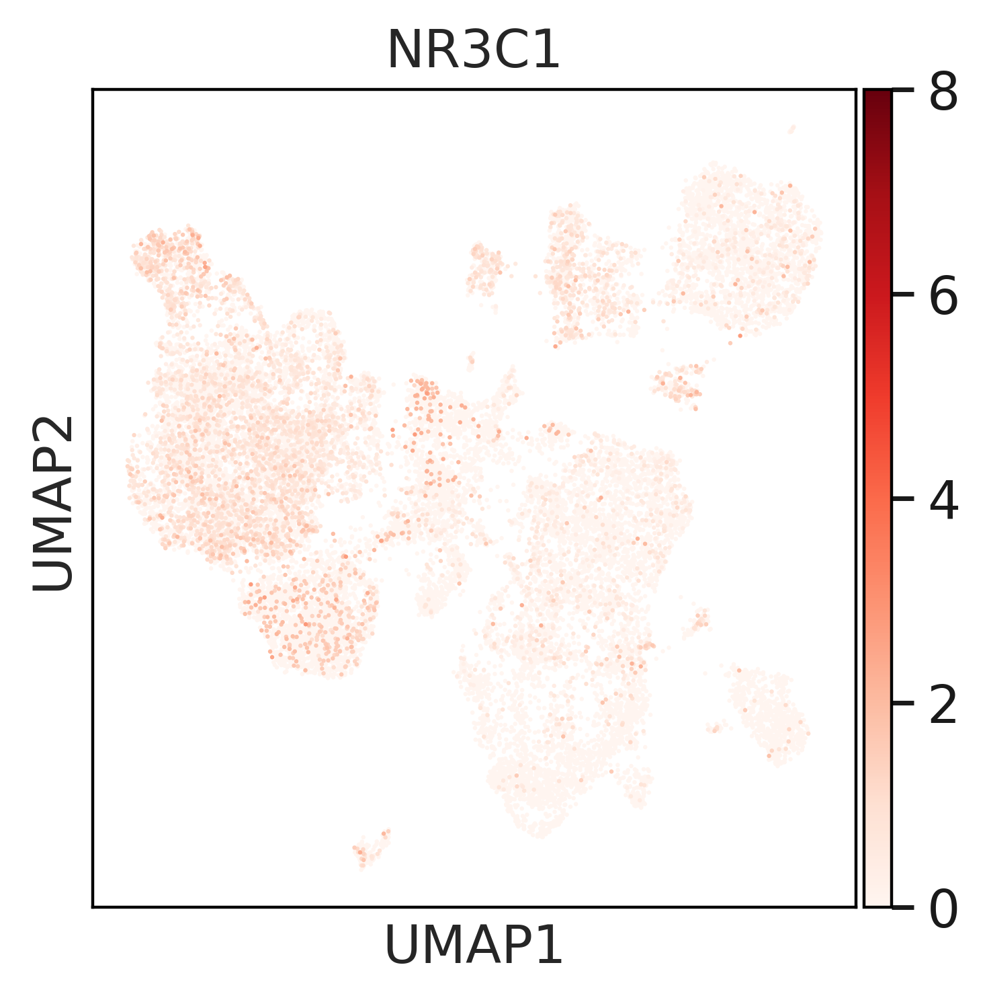

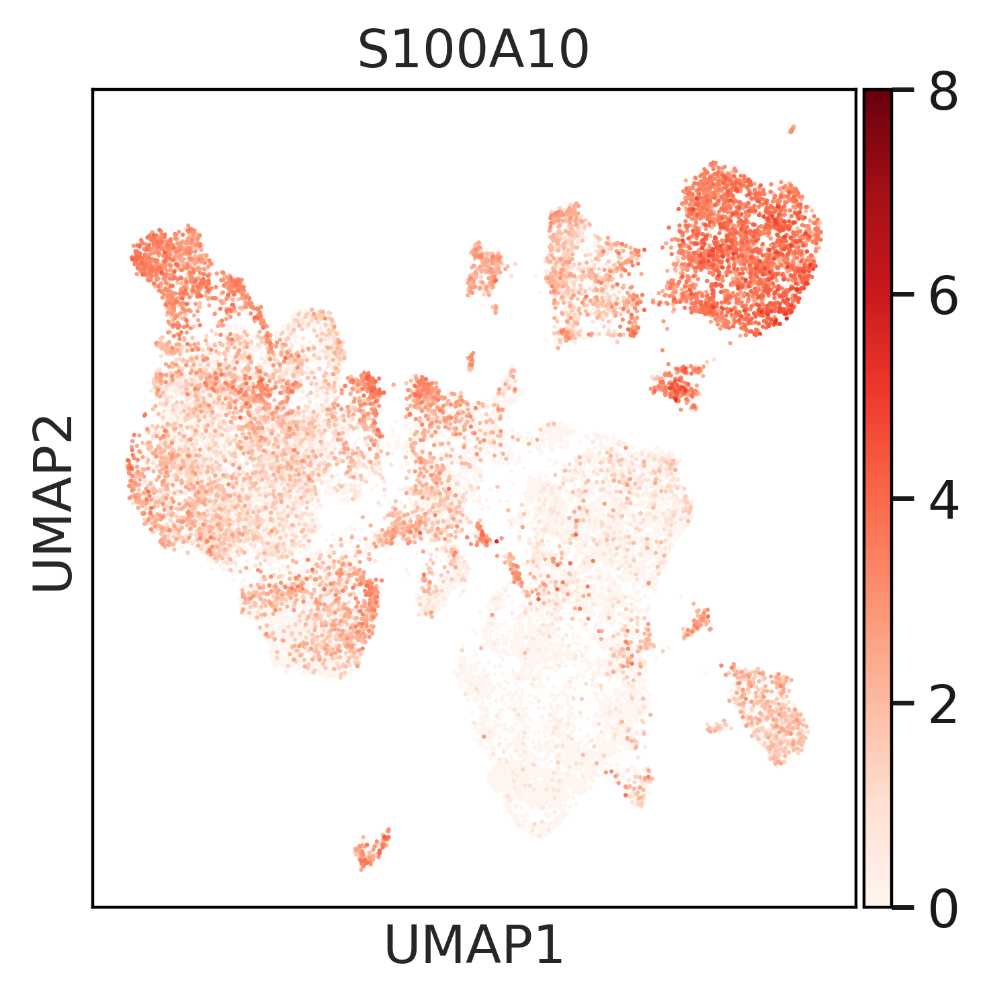

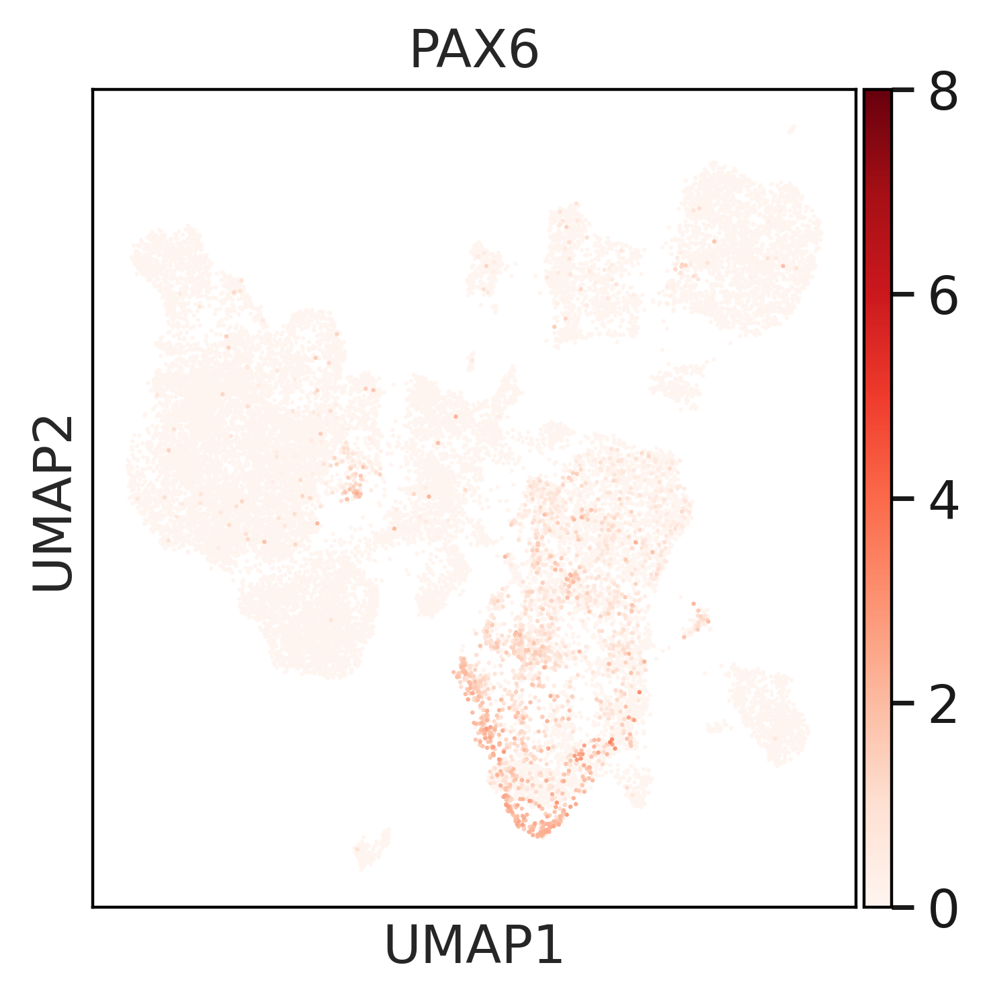

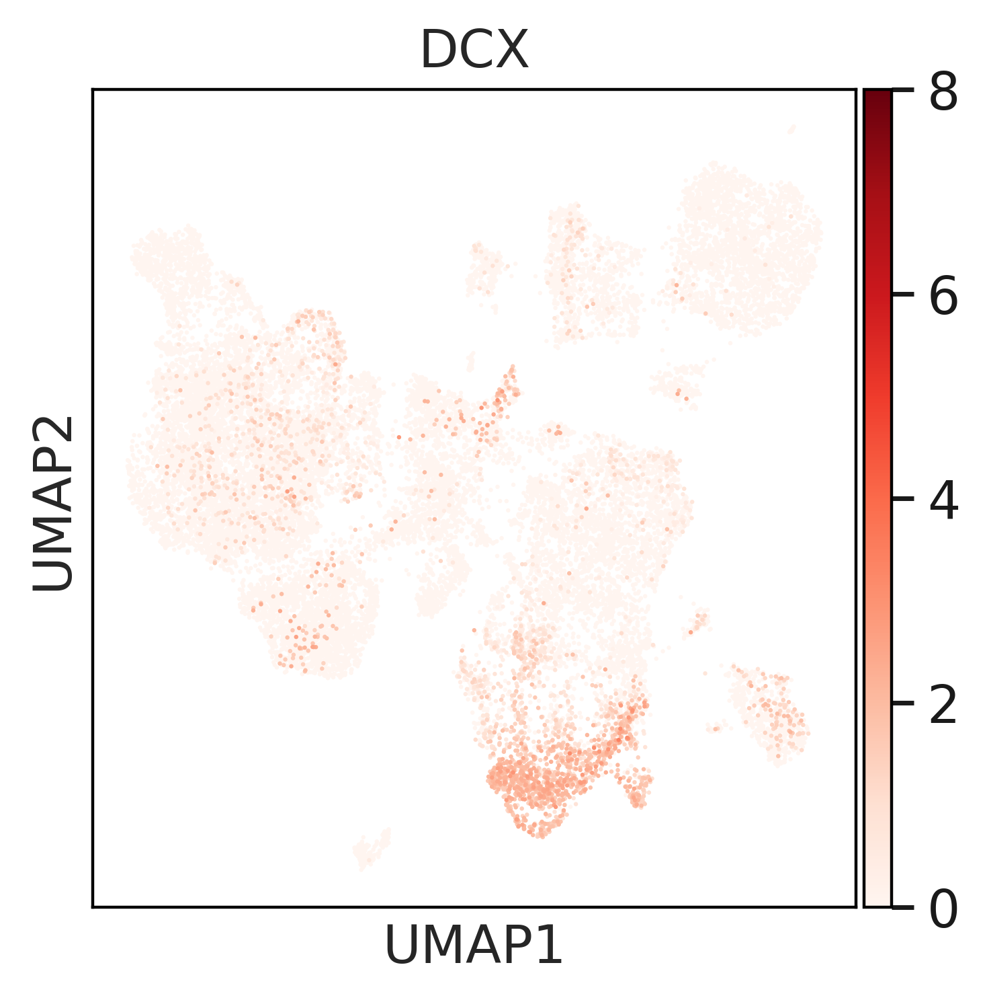

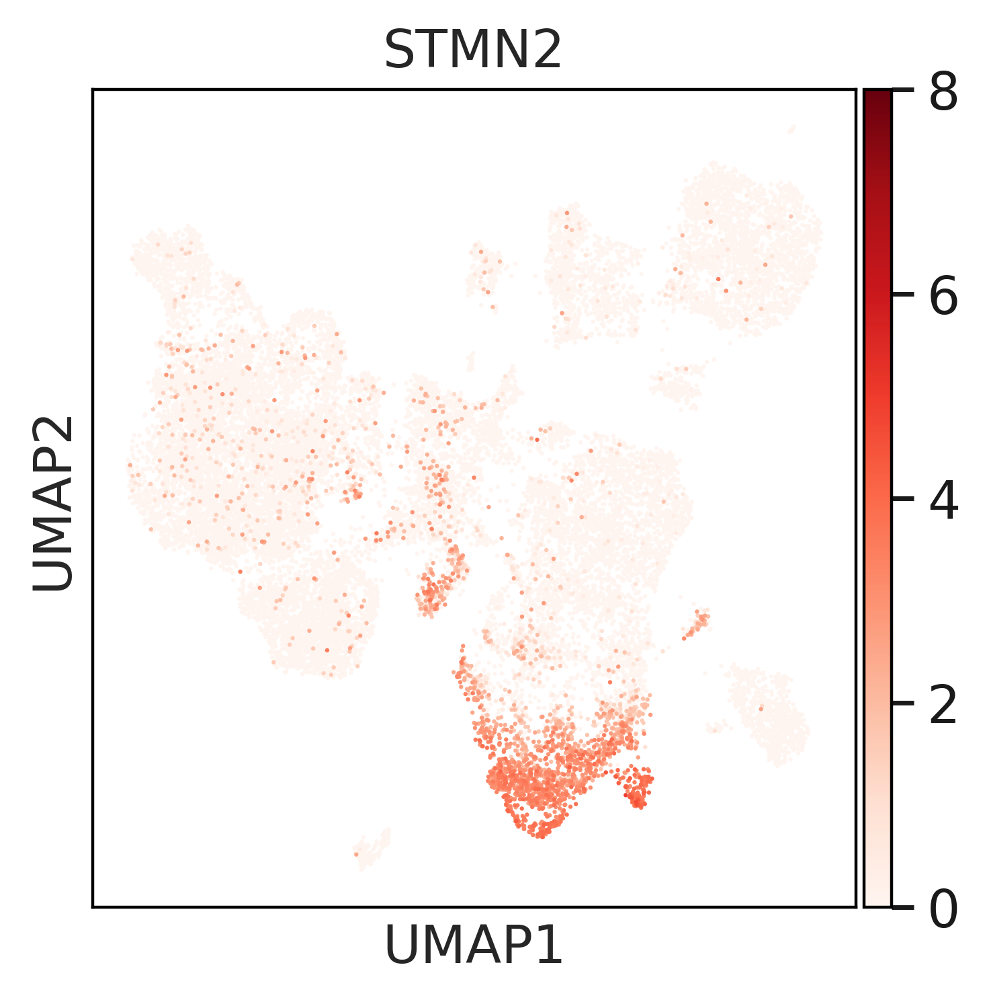

In [20]:
for g in ['NR3C1', 'S100A10', 'PAX6', 'DCX', 'STMN2']:
    sc.pl.umap(adata_fok, color=g, legend_loc='right margin', legend_fontsize=5, color_map="Reds", vmin=0, vmax=8, save=f'_fok_{g}.png')

In [21]:
# Print number of cells
for treat in ['Veh', 'Acu']:
    adata_tmp = adata_fok[adata_fok.obs['treatment'] == treat].copy()
    print(treat.upper(), 'Cells per group [FOK]')
    display(adata_tmp.obs['louvain_three'].value_counts())
    print(treat.upper(), 'NR3C1 positive Cells per group [FOK]')
    adata_tmp = adata_fok[(adata_fok[:,'NR3C1'].layers['counts'].A > 0)[:,0]].copy()
    display(adata_tmp.obs['louvain_three'].value_counts())

VEH Cells per group [FOK]


Non-Neural Progenitors    7341
Neural Progenitors        2968
Neurons                    578
Name: louvain_three, dtype: int64

VEH NR3C1 positive Cells per group [FOK]


Non-Neural Progenitors    3984
Neural Progenitors         919
Neurons                     68
Name: louvain_three, dtype: int64

ACU Cells per group [FOK]


Non-Neural Progenitors    7199
Neural Progenitors        3184
Neurons                   1194
Name: louvain_three, dtype: int64

ACU NR3C1 positive Cells per group [FOK]


Non-Neural Progenitors    3984
Neural Progenitors         919
Neurons                     68
Name: louvain_three, dtype: int64

## CL2 DE analysis

In [22]:
mast_de_groups(adata_fok, 'louvain_three', './differential_expression/mast_fok_three.xlsx')

R[write to console]: No dimnames in `exprsArray`, assuming `fData` and `cData` are sorted according to `exprsArray`

R[write to console]: Assuming data assay in position 1, with name et is log-transformed.

R[write to console]: 
Done!

R[write to console]: Combining coefficients and standard errors

R[write to console]: Calculating log-fold changes

R[write to console]: Calculating likelihood ratio tests

R[write to console]: Refitting on reduced model...

R[write to console]: 
Done!

R[write to console]: 
Done!

R[write to console]: Combining coefficients and standard errors

R[write to console]: Calculating log-fold changes

R[write to console]: Calculating likelihood ratio tests

R[write to console]: Refitting on reduced model...

R[write to console]: 
Done!

R[write to console]: 
Done!

R[write to console]: Combining coefficients and standard errors

R[write to console]: Calculating log-fold changes

R[write to console]: Calculating likelihood ratio tests

R[write to console]: Refi

Number of significant DE genes:
Non-Neural Progenitors: 15843
Neural Progenitors: 15314
Neurons: 3207


## CL2 Enrichment analysis

In [23]:
# Loading Data
suppl = pd.read_excel('./SupplTables.xlsx', sheet_name=None)

crossdict = {'symbs':suppl['Table S12'].iloc[:,0].tolist()[3:]}
crossdis = de.enrich.RefSets()
crossdis.add(id='CrossDisorder', source='c.c.', gene_ids=crossdict['symbs'])

intdisdict = {'symbs':suppl['Table S14'].iloc[:,0].tolist()[3:]}
intdis = de.enrich.RefSets()
intdis.add(id='IntellectDisabl', source='c.c.', gene_ids=intdisdict['symbs'])

del suppl

In [24]:
mastde_fok_louvain_three = pd.read_excel('./differential_expression/mast_fok_three.xlsx', sheet_name=None, index_col=0)
for c in fok_clusters_three:
     mastde_fok_louvain_three[c]['qval'] = [mastde_fok_louvain_three[c]['qval'][i] if np.abs(mastde_fok_louvain_three[c]['log2FC'][i]) >= 0.15 else 1.0 for i in mastde_fok_louvain_three[c].index]

### CL2 Crossdisorder

In [25]:
test_clust = [clust for clust in fok_clusters_three if sum(mastde_fok_louvain_three[clust]['qval'] <= 0.05)>0]
genes = [mastde_fok_louvain_three[name]['gene'].values for name in test_clust]
qvals = [mastde_fok_louvain_three[name]['qval'].values for name in test_clust]

tests = [de.enrich.test(ref=crossdis, gene_ids=genes[i], scores=qvals[i], threshold=0.05).summary().sort_index() for i in range(len(test_clust))]

pvals = []
for i in tests:
    pvals += i['pval'].values.tolist()
p_correct = statsmodels.stats.multitest.multipletests(
        pvals=pvals[:],
        alpha=1,
        method='fdr_bh',
        is_sorted=False,
        returnsorted=False
        )[1].tolist()
p_dict = {pval:p_correct[i] for i, pval in enumerate(pvals)}

for i, test in enumerate(tests):
    test['qval'] = [p_dict[val] for val in test['pval']]
    print(test_clust[i], '\n' , test.sort_index().iloc[:,:-1],'\n')

INFO:diffxpy: 135 overlaps found between refset (154) and provided gene list (26537).
INFO:diffxpy: 134 overlaps found between refset (154) and provided gene list (26290).
INFO:diffxpy: 131 overlaps found between refset (154) and provided gene list (23469).
Non-Neural Progenitors 
              set      pval      qval  intersection  reference  enquiry
0  CrossDisorder  0.982243  0.982243             3        154     1295 

Neural Progenitors 
              set     pval      qval  intersection  reference  enquiry
0  CrossDisorder  0.73488  0.982243             5        154     1042 

Neurons 
              set      pval      qval  intersection  reference  enquiry
0  CrossDisorder  0.059334  0.178001             8        154      637 



In [26]:
# Print overlapping genes
data = mastde_fok_louvain_three.copy()
overlaps = {}
for k in data.keys():
    data[k] = set(data[k][data[k]['qval']<=0.05]['gene'].tolist())
    overlaps[k] = {'CrossDisorder':list(crossdis.sets[0].genes.intersection(data[k]))}

for k in overlaps.keys():
    print(k, overlaps[k], '\n')

Non-Neural Progenitors {'CrossDisorder': ['SRPK2', 'SEZ6L2', 'FGFR1']} 

Neural Progenitors {'CrossDisorder': ['SRPK2', 'FADS1', 'PPP2R2B', 'FADS2', 'SYNE2']} 

Neurons {'CrossDisorder': ['SRPK2', 'RTN1', 'TCF4', 'DCC', 'FGFR1', 'ANKS1B', 'ZNF608', 'NRGN']} 



In [27]:
# Saving enrichment results to file
writer = pd.ExcelWriter('./enrichment/enrichment_crossdis_degenes_fok_threegroups_DEfilt.xlsx', engine='xlsxwriter')
for i, test in enumerate(tests):
    test.to_excel(writer, sheet_name=fok_clusters_three[i], index=False)
writer.save()

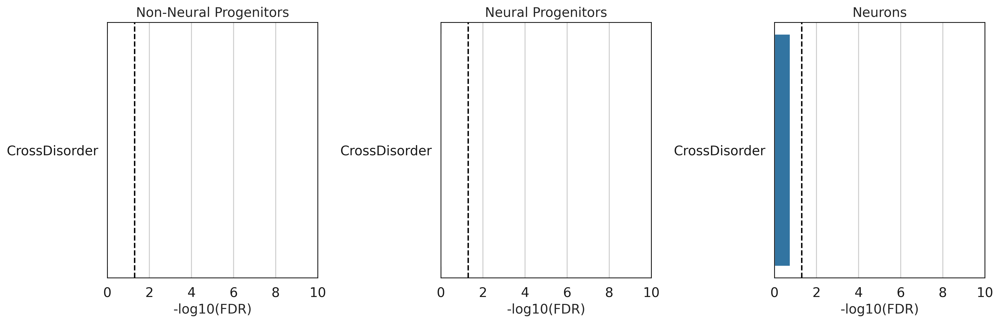

In [28]:
# Plot results
dfs = []
for i, clust in enumerate(test_clust):
    df = tests[i]
    df['qval'] = -np.log10(df['qval'])
    dfs += [df]


plt.rcParams.update({'figure.autolayout': True})
fig,axlist = plt.subplots(1,3, figsize=(15, 5))
for i, ax in enumerate(axlist.flatten().tolist()):
    if i == len(test_clust):
        break

    sns.barplot(x='qval', y='set', data=dfs[i], ax=ax)
    ax.set_xlim([0.0, 10.0])
    ax.axvline(x=1.3010299956639813, color='black', linestyle='--')
    ax.set_xlabel('-log10(FDR)')
    ax.set_ylabel(None)
    ax.set_title(test_clust[i])

plt.savefig(sc.settings.figdir / 'enrichment_crossdis_fok_three_DEfilt.png',dpi=300, bbox_inches="tight")

### CL2 Intellectual Disability

In [29]:
test_clust = [clust for clust in fok_clusters_three if sum(mastde_fok_louvain_three[clust]['qval'] <= 0.05)>0]
genes = [mastde_fok_louvain_three[name]['gene'].values for name in test_clust]
qvals = [mastde_fok_louvain_three[name]['qval'].values for name in test_clust]

tests = [de.enrich.test(ref=intdis, gene_ids=genes[i], scores=qvals[i], threshold=0.05).summary().sort_index() for i in range(len(test_clust))]

pvals = []
for i in tests:
    pvals += i['pval'].values.tolist()
p_correct = statsmodels.stats.multitest.multipletests(
        pvals=pvals[:],
        alpha=1,
        method='fdr_bh',
        is_sorted=False,
        returnsorted=False
        )[1].tolist()
p_dict = {pval:p_correct[i] for i, pval in enumerate(pvals)}

for i, test in enumerate(tests):
    test['qval'] = [p_dict[val] for val in test['pval']]
    print(test_clust[i], '\n' , test.sort_index().iloc[:,:-1],'\n')

INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26290).
INFO:diffxpy: 215 overlaps found between refset (217) and provided gene list (23469).
Non-Neural Progenitors 
                set      pval      qval  intersection  reference  enquiry
0  IntellectDisabl  0.262949  0.262949            13        217     1295 

Neural Progenitors 
                set      pval      qval  intersection  reference  enquiry
0  IntellectDisabl  0.091922  0.137883            13        217     1042 

Neurons 
                set      pval      qval  intersection  reference  enquiry
0  IntellectDisabl  0.002535  0.007605            14        217      637 



In [30]:
# Print overlapping genes
data = mastde_fok_louvain_three.copy()
overlaps = {}
for k in data.keys():
    data[k] = set(data[k][data[k]['qval']<=0.05]['gene'].tolist())
    overlaps[k] = {'IntellectDisabl':list(intdis.sets[0].genes.intersection(data[k]))}

for k in overlaps.keys():
    print(k, overlaps[k], '\n')

Non-Neural Progenitors {'IntellectDisabl': ['FOXP1', 'ATRX', 'ASXL1', 'SON', 'PDHA1', 'RAB2A', 'ANKRD11', 'UBE2A', 'TUSC3', 'SOX11', 'CAMTA1', 'SLC2A1', 'SLC6A8']} 

Neural Progenitors {'IntellectDisabl': ['FOXP1', 'NFIA', 'KMT2E', 'HNRNPU', 'SON', 'PDHA1', 'RAB2A', 'ANKRD11', 'GPC3', 'SLC2A1', 'CAMTA1', 'CTNNB1', 'TTN']} 

Neurons {'IntellectDisabl': ['AUTS2', 'CHD7', 'PRRT2', 'KMT2E', 'PDHA1', 'ANKRD11', 'DST', 'TCF4', 'PAX6', 'THSD7A', 'KDM5B', 'SOX11', 'CTNNB1', 'ITSN1']} 



In [31]:
# Saving enrichment results to file
writer = pd.ExcelWriter('./enrichment/enrichment_intdis_degenes_fok_threegroups_DEfilt.xlsx', engine='xlsxwriter')
for i, test in enumerate(tests):
    test.to_excel(writer, sheet_name=fok_clusters_three[i], index=False)
writer.save()

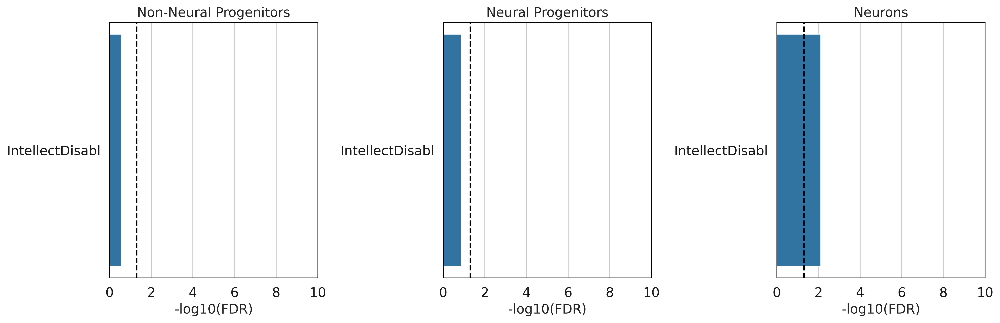

In [32]:
# Plot results
dfs = []
for i, clust in enumerate(test_clust):
    df = tests[i]
    df['qval'] = -np.log10(df['qval'])
    df = df.replace(np.inf, 100)
    dfs += [df]


plt.rcParams.update({'figure.autolayout': True})
fig,axlist = plt.subplots(1,3, figsize=(15, 5))
for i, ax in enumerate(axlist.flatten().tolist()):
    if i == len(test_clust):
        break

    sns.barplot(x='qval', y='set', data=dfs[i], ax=ax)
    ax.set_xlim([0.0, 10.0])
    ax.axvline(x=1.3010299956639813, color='black', linestyle='--')
    ax.set_xlabel('-log10(FDR)')
    ax.set_ylabel(None)
    ax.set_title(test_clust[i])

plt.savefig(sc.settings.figdir / 'enrichment_intdis_fok_three_DEfilt.png',dpi=300, bbox_inches="tight")

### CL2 Permutation Tests

In [33]:
intdisability = de.enrich.RefSets()
intdisability.add(id='IntellectDisabl', source='c.c.', gene_ids=intdis.sets[0].genes)

crossdisorder = de.enrich.RefSets()
crossdisorder.add(id='CrossDisorder', source='c.c.', gene_ids=crossdis.sets[0].genes)

In [34]:
for stepsize in [(100,'random-sampling'), (20,'quintiles-sampling')]: #run permutations for both quintiles binning and random sampling
    for grp in mastde_fok_louvain_three.keys():
        sigpool = mastde_fok_louvain_three[grp][mastde_fok_louvain_three[grp]['qval'] <= 0.05]
        nonsigpool = mastde_fok_louvain_three[grp][mastde_fok_louvain_three[grp]['qval'] > 0.05]

        # get cutoffs for quantiles from significant DE genes
        quantiles = {}
        quantiles["vals"] = [0.0]
        quantiles["vals"] += [sigpool.quantile(i/100)["meanExpr"] for i in range(0,101,stepsize[0])][1:]

        # get number of genes per quantile
        quantiles['n'] = []
        for i in range(len(quantiles['vals'])-1):
            quantiles['n'].append(len(sigpool[(sigpool["meanExpr"] > quantiles['vals'][i]) & (sigpool["meanExpr"] <= quantiles['vals'][i+1])]['gene'].tolist()))

        # sample same binned distribution and number of genes from non-significant pool
        decdf = pd.DataFrame()

        for j in range(1000):
            declist = []
            for i in range(len(quantiles['n'])):
                declist += nonsigpool[(nonsigpool["meanExpr"] > quantiles['vals'][i]) & (nonsigpool["meanExpr"] <= quantiles['vals'][i+1])]['gene'].sample(n=quantiles['n'][i]).tolist()
            decdf[j] = declist

        # perform enrichment tests
        for refset in [intdisability, crossdisorder]:
            dectests = pd.DataFrame(columns=['set', 'pval', 'intersection', 'reference', 'enquiry', 'background'])
            for i in range(decdf.shape[1]):
                dectests = dectests.append(de.enrich.test(ref=refset, gene_ids=decdf[i].tolist(), scores=[0.0 for j in range(len(sigpool))], threshold=1.0, all_ids=mastde_fok_louvain_three[grp]['gene'].tolist()).summary(), ignore_index=True)

            # write to file
            writer = pd.ExcelWriter(f'./enrichment/permutationtests_threegroups_fok_DEfilt-{stepsize[1]}_{refset.sets[0].id}_{grp}.xlsx', engine='xlsxwriter')
            decdf.to_excel(writer,sheet_name="lists")
            dectests.sort_values("pval").to_excel(writer,sheet_name="results")
            writer.save()

INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26537).
INFO:diffxpy: 216 overlaps found between refset (217) 

ValueError: Cannot take a larger sample than population when 'replace=False'

In [35]:
adata_fok.write('./adata_fok.h5ad')

# Cell Line 3 (HPS0076)

## CL3 Preprocess Data

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA with n_comps = 50
    finished (0:00:15)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:01)


/opt/python/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


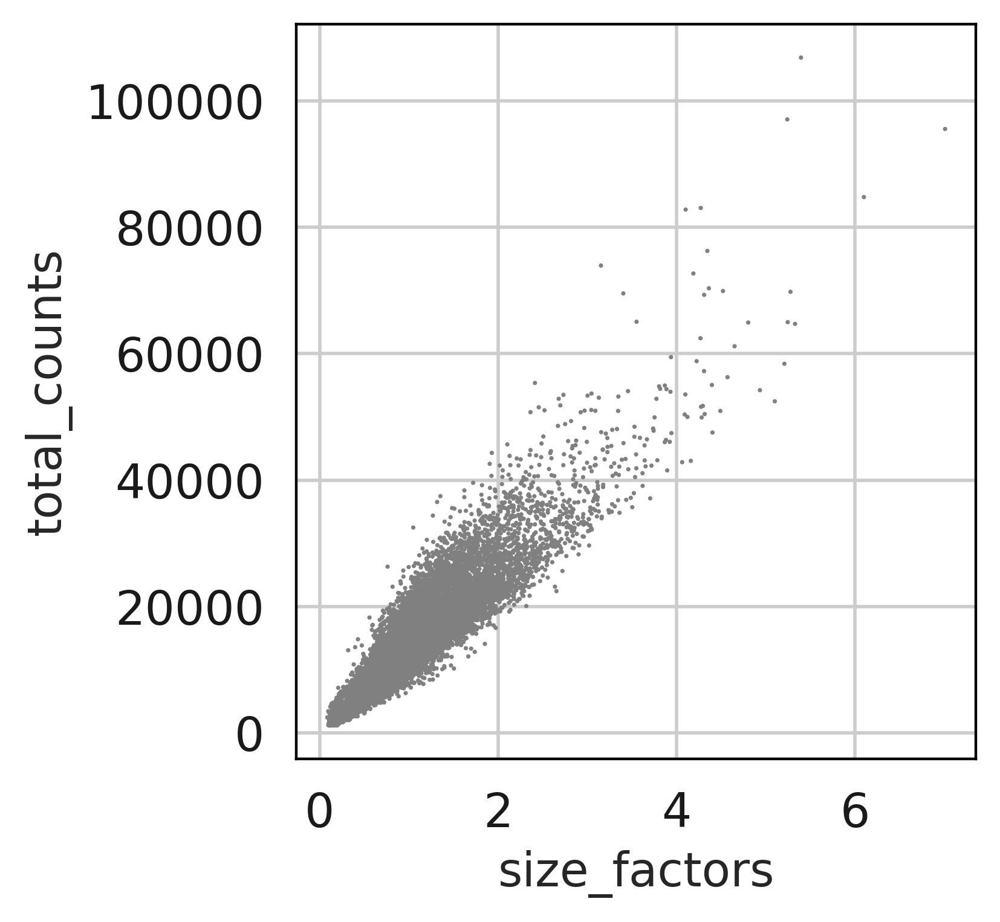

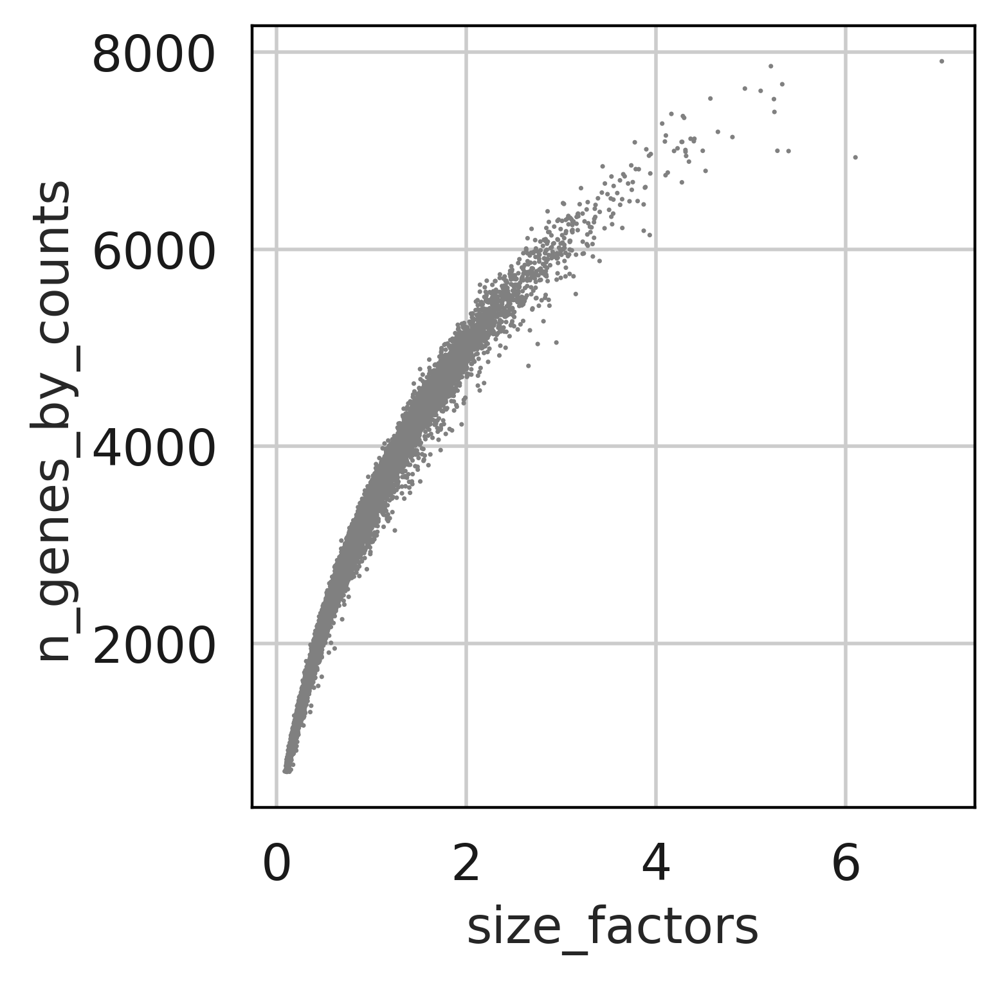

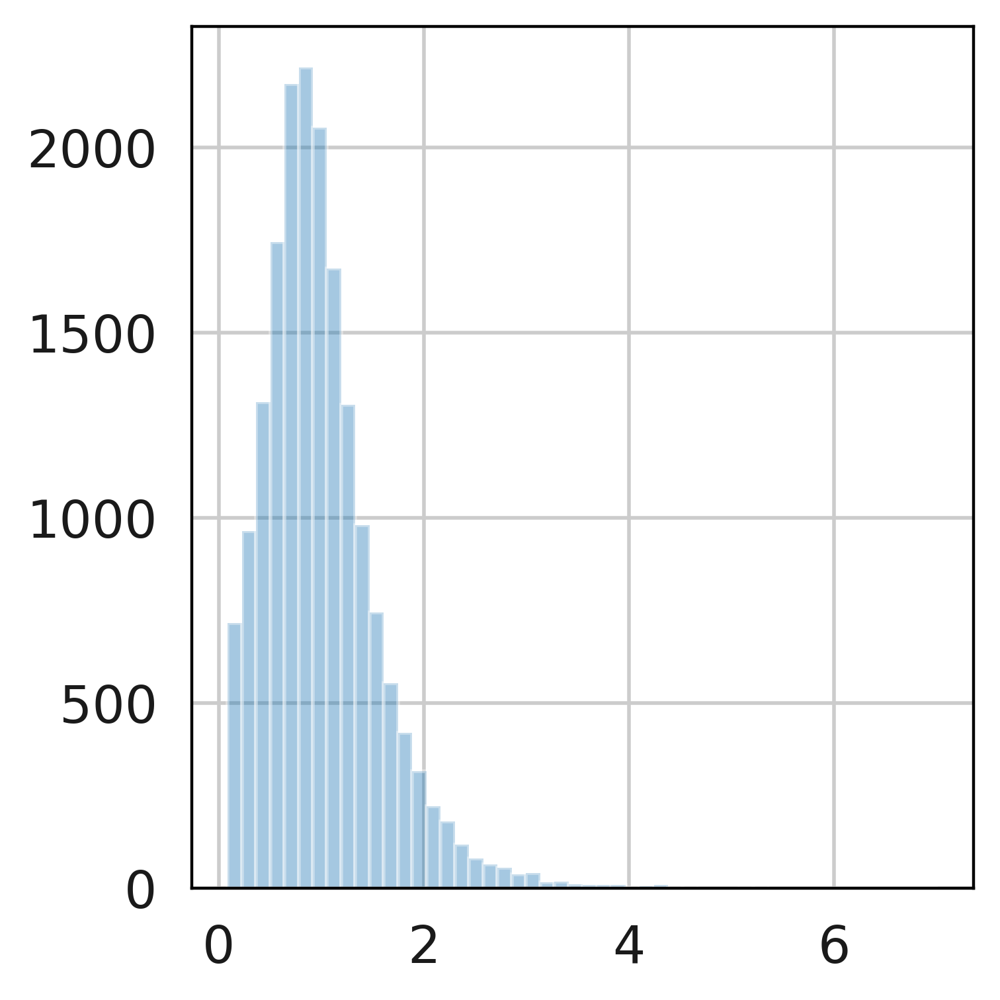

In [36]:
# Create object for Cell Line 3
adata_hps = adata[adata.obs["cellline"] == "HPS0076"].copy()
adata_hps = adata_hps[adata_hps.obs["louvain_three"] != "unassigned"].copy()
adata_hps.obs["louvain_three"] = adata_hps.obs["louvain_three"].cat.remove_unused_categories()
hps_clusters_three = list(adata_hps.obs['louvain_three'].cat.categories)

# Densify adata
adata_hps.layers["counts"] = adata_hps.X.copy()
adata_hps.X = adata_hps.X.A

# Perform a clustering for improved scran normalization in clusters
adata_pp = adata_hps.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

# Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = np.array(adata_hps.X.T)
del adata_pp

# Run scran
%R -i input_groups -i data_mat -o size_factors size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

# Visualize the estimated size factors
adata_hps.obs['size_factors'] = size_factors
sc.pl.scatter(adata_hps, 'size_factors', 'total_counts')
sc.pl.scatter(adata_hps, 'size_factors', 'n_genes_by_counts')
sns.distplot(size_factors, bins=50, kde=False)
plt.show()

del data_mat, input_groups

In [37]:
# LogNormalize adata 
adata_hps.X /= adata_hps.obs['size_factors'].values[:,None]
sc.pp.log1p(adata_hps)

# Keep normalised data in seperate layer
adata_hps.layers["scran"] = scipy.sparse.csr_matrix(adata_hps.X).copy()

# Check dropout
print("Dropout:", np.sum(adata_hps.X == 0)/np.size(adata_hps.X))

# Annotate highly variable genes
sc.pp.highly_variable_genes(adata_hps, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_hps.var['highly_variable'])))
adata_hps.X = scipy.sparse.csr_matrix(adata_hps.X)

Dropout: 0.8781765069385662
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 3999


In [38]:
sc.pp.pca(adata_hps)
sc.pp.neighbors(adata_hps)
sc.tl.umap(adata_hps)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


## CL3 Data overview

**Figure 5c:**
<a id="fig5c"></a>

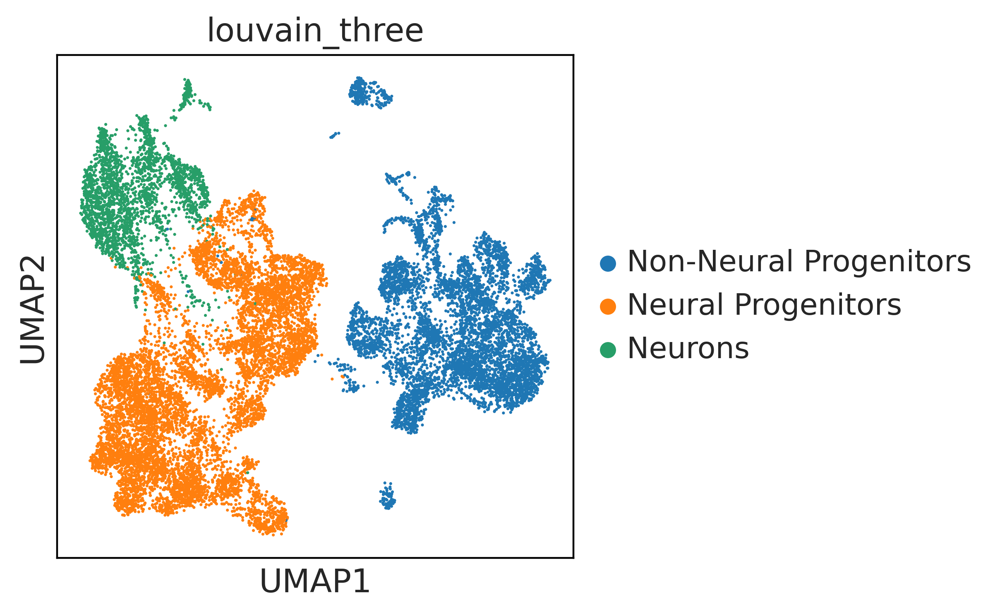

In [39]:
sc.pl.umap(adata_hps, color='louvain_three', save='_hps_threegroups.png')

**Supplementary Figure 9c:**
<a id="suppfig9c"></a>

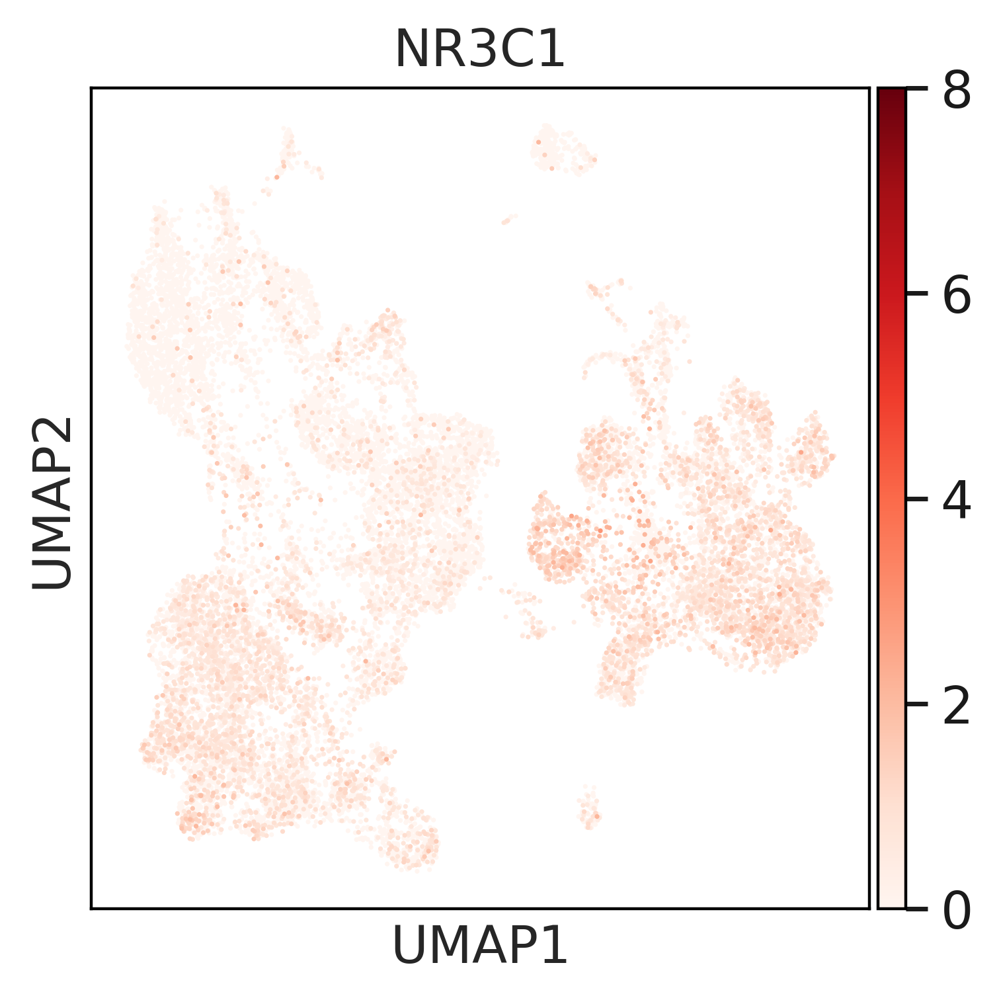

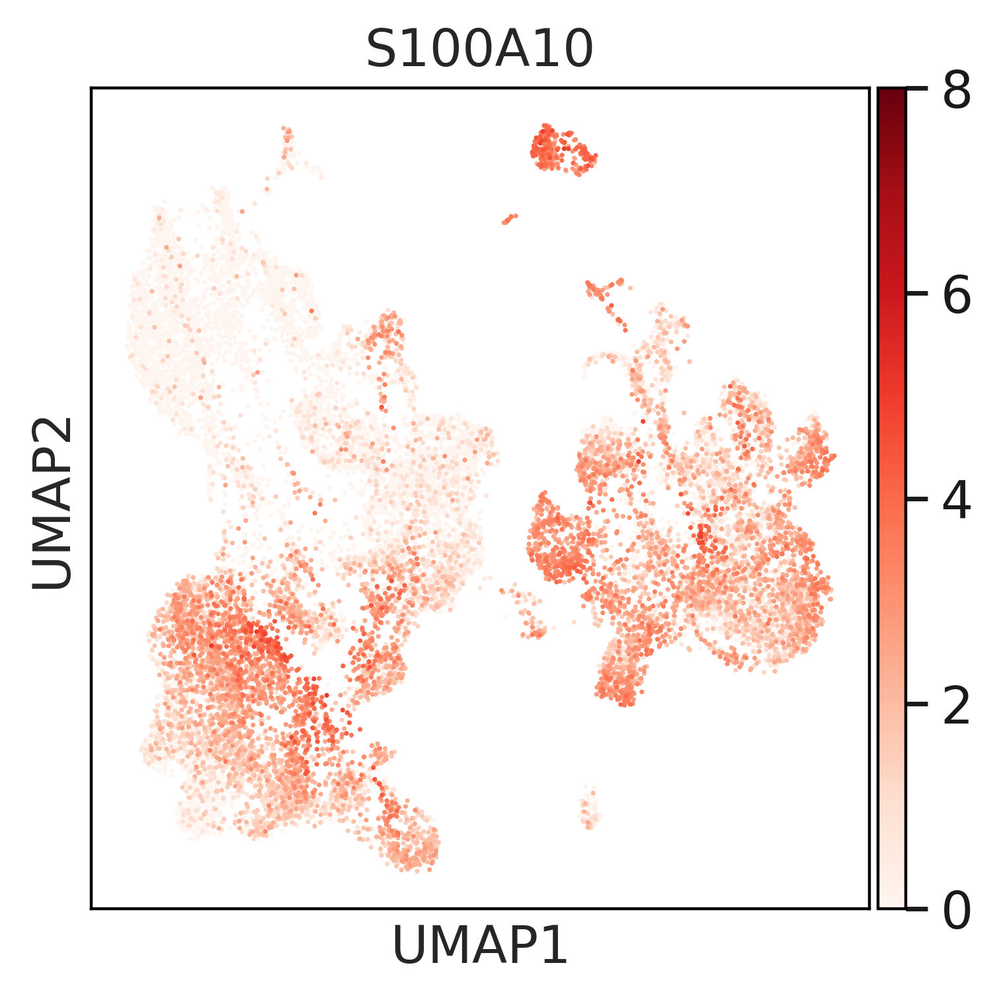

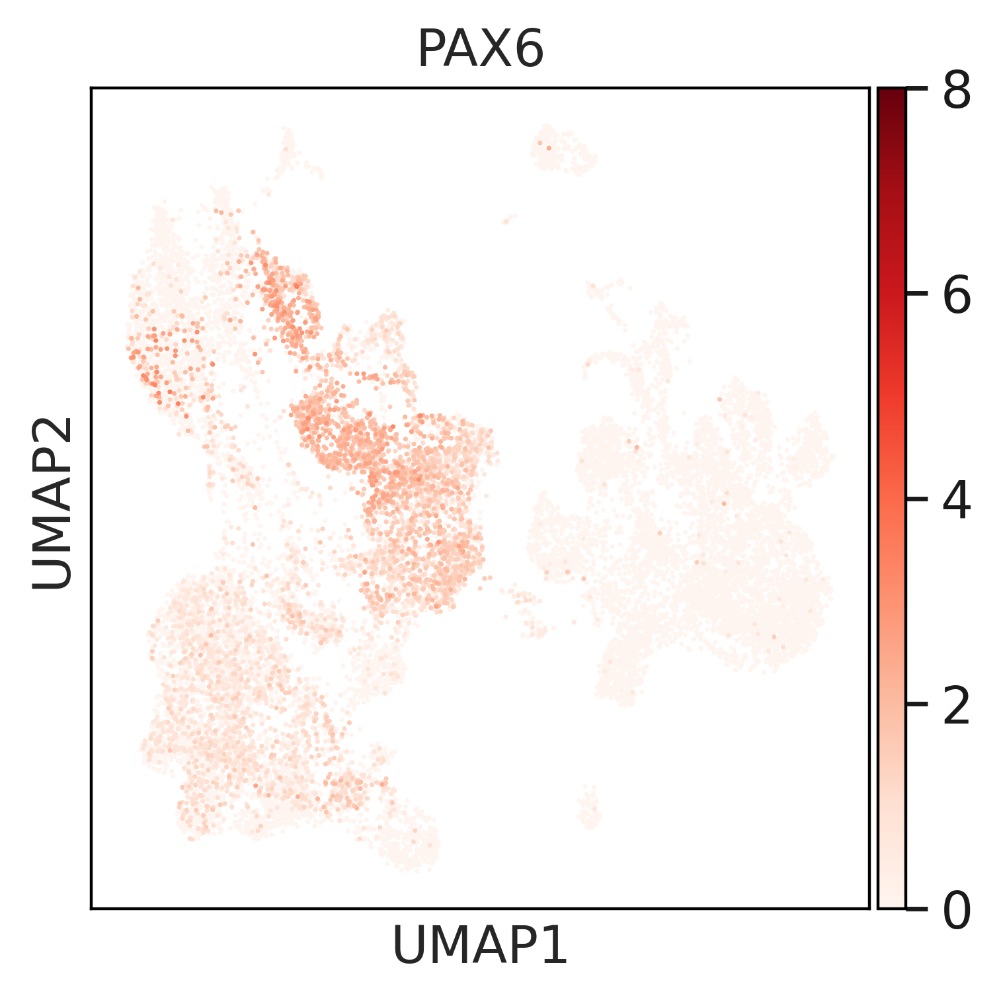

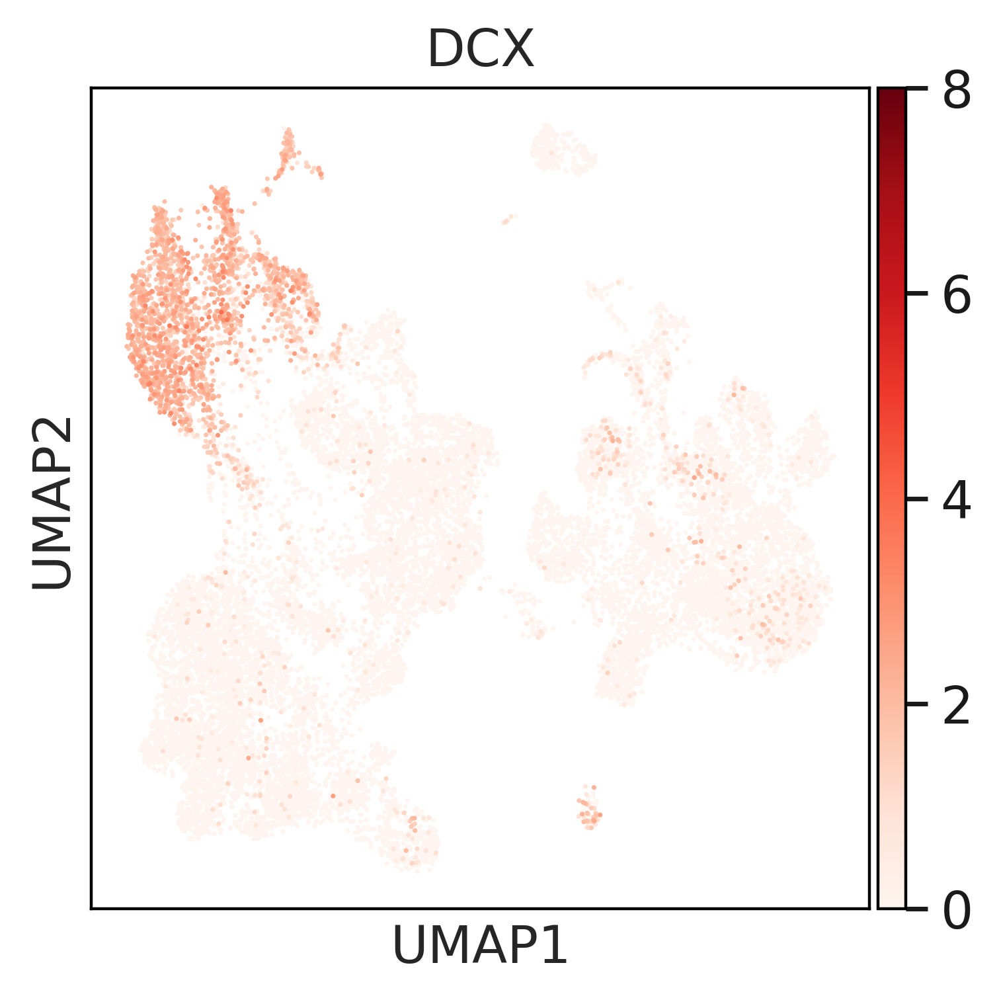

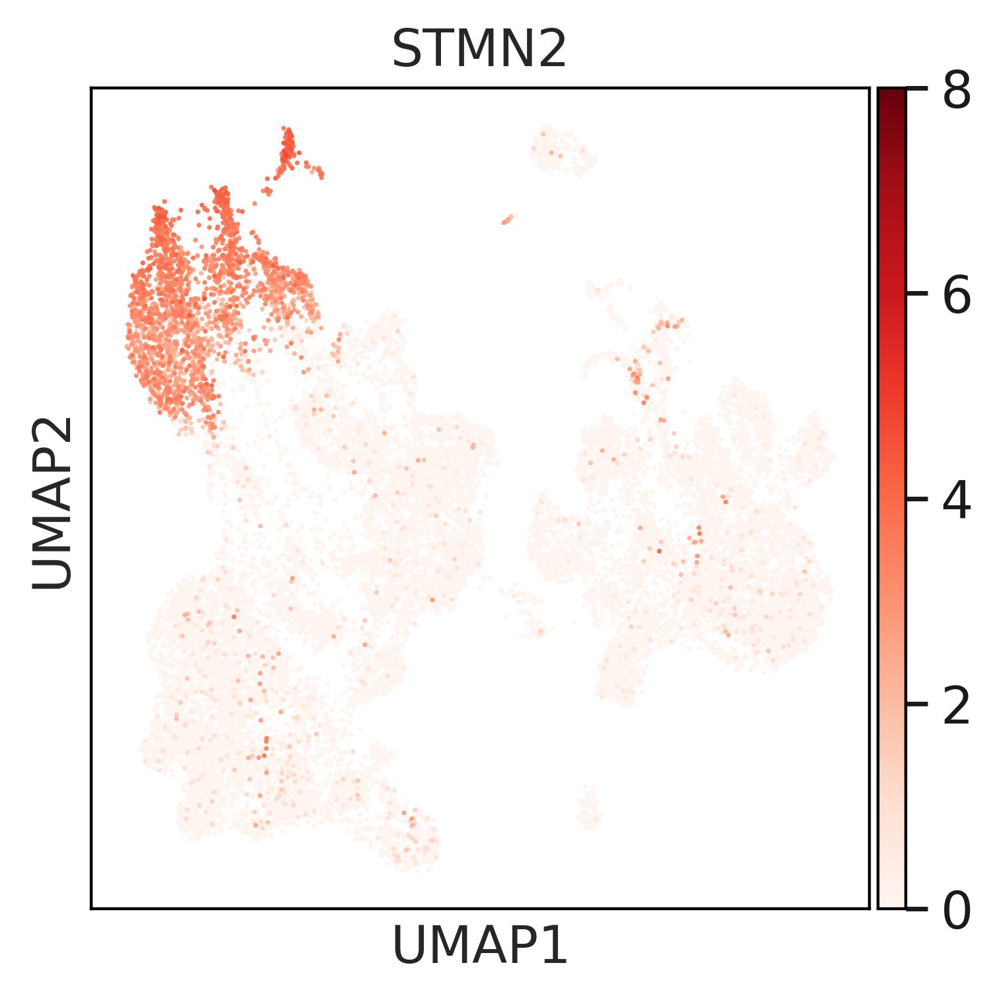

In [40]:
for g in ['NR3C1', 'S100A10', 'PAX6', 'DCX', 'STMN2']:
    sc.pl.umap(adata_hps, color=g, legend_loc='right margin', legend_fontsize=5, color_map="Reds", vmin=0, vmax=8, save=f'_hps_{g}.png')

In [41]:
# Print number of cells
for treat in ['Veh', 'Acu']:
    adata_tmp = adata_hps[adata_hps.obs['treatment'] == treat].copy()
    print(treat.upper(), 'Cells per group [HPS]')
    display(adata_tmp.obs['louvain_three'].value_counts())
    print(treat.upper(), 'NR3C1 positive Cells per group [HPS]')
    adata_tmp = adata_hps[(adata_hps[:,'NR3C1'].layers['counts'].A > 0)[:,0]].copy()
    display(adata_tmp.obs['louvain_three'].value_counts())

VEH Cells per group [HPS]


Neural Progenitors        4365
Non-Neural Progenitors    3984
Neurons                   1650
Name: louvain_three, dtype: int64

VEH NR3C1 positive Cells per group [HPS]


Non-Neural Progenitors    3116
Neural Progenitors        2911
Neurons                    156
Name: louvain_three, dtype: int64

ACU Cells per group [HPS]


Neural Progenitors        4665
Non-Neural Progenitors    2458
Neurons                    962
Name: louvain_three, dtype: int64

ACU NR3C1 positive Cells per group [HPS]


Non-Neural Progenitors    3116
Neural Progenitors        2911
Neurons                    156
Name: louvain_three, dtype: int64

## CL3 DE analysis

In [42]:
mast_de_groups(adata_hps, 'louvain_three', './differential_expression/mast_hps_three.xlsx')

R[write to console]: No dimnames in `exprsArray`, assuming `fData` and `cData` are sorted according to `exprsArray`

R[write to console]: Assuming data assay in position 1, with name et is log-transformed.

R[write to console]: 
Done!

R[write to console]: Combining coefficients and standard errors

R[write to console]: Calculating log-fold changes

R[write to console]: Calculating likelihood ratio tests

R[write to console]: Refitting on reduced model...

R[write to console]: 
Done!

R[write to console]: 
Done!

R[write to console]: Combining coefficients and standard errors

R[write to console]: Calculating log-fold changes

R[write to console]: Calculating likelihood ratio tests

R[write to console]: Refitting on reduced model...

R[write to console]: 
Done!

R[write to console]: 
Done!

R[write to console]: Combining coefficients and standard errors

R[write to console]: Calculating log-fold changes

R[write to console]: Calculating likelihood ratio tests

R[write to console]: Refi

Number of significant DE genes:
Non-Neural Progenitors: 7703
Neural Progenitors: 8086
Neurons: 1808


## CL3 Enrichment analysis

In [43]:
# Loading Data
suppl = pd.read_excel('./SupplTables.xlsx', sheet_name=None)

crossdict = {'symbs':suppl['Table S12'].iloc[:,0].tolist()[3:]}
crossdis = de.enrich.RefSets()
crossdis.add(id='CrossDisorder', source='c.c.', gene_ids=crossdict['symbs'])

intdisdict = {'symbs':suppl['Table S14'].iloc[:,0].tolist()[3:]}
intdis = de.enrich.RefSets()
intdis.add(id='IntellectDisabl', source='c.c.', gene_ids=intdisdict['symbs'])

del suppl

In [44]:
mastde_hps_louvain_three = pd.read_excel('./differential_expression/mast_hps_three.xlsx', sheet_name=None, index_col=0)
for c in hps_clusters_three:
     mastde_hps_louvain_three[c]['qval'] = [mastde_hps_louvain_three[c]['qval'][i] if np.abs(mastde_hps_louvain_three[c]['log2FC'][i]) >= 0.15 else 1.0 for i in mastde_hps_louvain_three[c].index]

### CL3 Crossdisorder

In [45]:
test_clust = [clust for clust in hps_clusters_three if sum(mastde_hps_louvain_three[clust]['qval'] <= 0.05)>0]
genes = [mastde_hps_louvain_three[name]['gene'].values for name in test_clust]
qvals = [mastde_hps_louvain_three[name]['qval'].values for name in test_clust]

tests = [de.enrich.test(ref=crossdis, gene_ids=genes[i], scores=qvals[i], threshold=0.05).summary().sort_index() for i in range(len(test_clust))]

pvals = []
for i in tests:
    pvals += i['pval'].values.tolist()
p_correct = statsmodels.stats.multitest.multipletests(
        pvals=pvals[:],
        alpha=1,
        method='fdr_bh',
        is_sorted=False,
        returnsorted=False
        )[1].tolist()
p_dict = {pval:p_correct[i] for i, pval in enumerate(pvals)}

for i, test in enumerate(tests):
    test['qval'] = [p_dict[val] for val in test['pval']]
    print(test_clust[i], '\n' , test.sort_index().iloc[:,:-1],'\n')

INFO:diffxpy: 133 overlaps found between refset (154) and provided gene list (26128).
INFO:diffxpy: 132 overlaps found between refset (154) and provided gene list (26089).
INFO:diffxpy: 132 overlaps found between refset (154) and provided gene list (24016).
Non-Neural Progenitors 
              set      pval      qval  intersection  reference  enquiry
0  CrossDisorder  0.911843  0.911843             4        154     1151 

Neural Progenitors 
              set      pval     qval  intersection  reference  enquiry
0  CrossDisorder  0.324073  0.48611             6        154      790 

Neurons 
              set      pval      qval  intersection  reference  enquiry
0  CrossDisorder  0.058744  0.176231             7        154      538 



In [46]:
# Print overlapping genes
data = mastde_hps_louvain_three.copy()
overlaps = {}
for k in data.keys():
    data[k] = set(data[k][data[k]['qval']<=0.05]['gene'].tolist())
    overlaps[k] = {'CrossDisorder':list(crossdis.sets[0].genes.intersection(data[k]))}

for k in overlaps.keys():
    print(k, overlaps[k], '\n')

Non-Neural Progenitors {'CrossDisorder': ['FADS2', 'FGFR1', 'PCMTD1', 'TCF4']} 

Neural Progenitors {'CrossDisorder': ['PPP2R2B', 'PCMTD1', 'SYNE2', 'SEZ6L2', 'LINC00461', 'SPAG16']} 

Neurons {'CrossDisorder': ['PPP2R2B', 'PCMTD1', 'RTN1', 'TCF4', 'SEZ6L2', 'RSRC1', 'LINC00461']} 



In [47]:
# Saving enrichment results to file
writer = pd.ExcelWriter('./enrichment/enrichment_crossdis_degenes_hps_threegroups_DEfilt.xlsx', engine='xlsxwriter')
for i, test in enumerate(tests):
    test.to_excel(writer, sheet_name=hps_clusters_three[i], index=False)
writer.save()

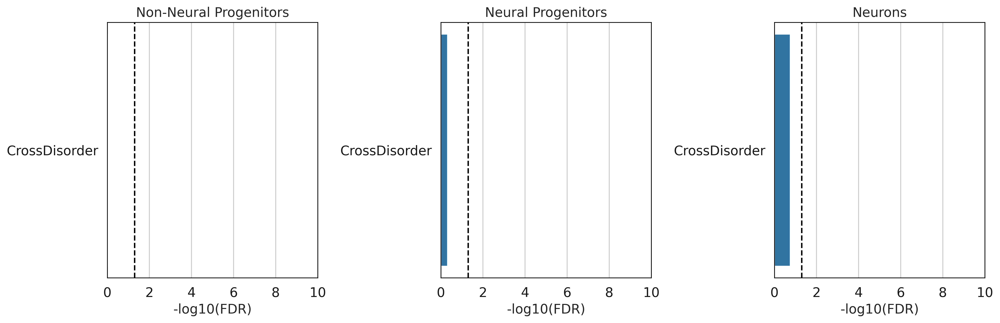

In [48]:
# Plot results
dfs = []
for i, clust in enumerate(test_clust):
    df = tests[i]
    df['qval'] = -np.log10(df['qval'])
    dfs += [df]


plt.rcParams.update({'figure.autolayout': True})
fig,axlist = plt.subplots(1,3, figsize=(15, 5))
for i, ax in enumerate(axlist.flatten().tolist()):
    if i == len(test_clust):
        break

    sns.barplot(x='qval', y='set', data=dfs[i], ax=ax)
    ax.set_xlim([0.0, 10.0])
    ax.axvline(x=1.3010299956639813, color='black', linestyle='--')
    ax.set_xlabel('-log10(FDR)')
    ax.set_ylabel(None)
    ax.set_title(test_clust[i])

plt.savefig(sc.settings.figdir / 'enrichment_crossdis_hps_three_DEfilt.png',dpi=300, bbox_inches="tight")

### CL3 Intellectual Disability

In [49]:
test_clust = [clust for clust in hps_clusters_three if sum(mastde_hps_louvain_three[clust]['qval'] <= 0.05)>0]
genes = [mastde_hps_louvain_three[name]['gene'].values for name in test_clust]
qvals = [mastde_hps_louvain_three[name]['qval'].values for name in test_clust]

tests = [de.enrich.test(ref=intdis, gene_ids=genes[i], scores=qvals[i], threshold=0.05).summary().sort_index() for i in range(len(test_clust))]

pvals = []
for i in tests:
    pvals += i['pval'].values.tolist()
p_correct = statsmodels.stats.multitest.multipletests(
        pvals=pvals[:],
        alpha=1,
        method='fdr_bh',
        is_sorted=False,
        returnsorted=False
        )[1].tolist()
p_dict = {pval:p_correct[i] for i, pval in enumerate(pvals)}

for i, test in enumerate(tests):
    test['qval'] = [p_dict[val] for val in test['pval']]
    print(test_clust[i], '\n' , test.sort_index().iloc[:,:-1],'\n')

INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 215 overlaps found between refset (217) and provided gene list (26089).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (24016).
Non-Neural Progenitors 
                set      pval      qval  intersection  reference  enquiry
0  IntellectDisabl  0.162973  0.162973            13        217     1151 

Neural Progenitors 
                set      pval      qval  intersection  reference  enquiry
0  IntellectDisabl  0.067009  0.100514            11        217      790 

Neurons 
                set     pval      qval  intersection  reference  enquiry
0  IntellectDisabl  0.00376  0.011279            12        217      538 



In [50]:
# Print overlapping genes
data = mastde_hps_louvain_three.copy()
overlaps = {}
for k in data.keys():
    data[k] = set(data[k][data[k]['qval']<=0.05]['gene'].tolist())
    overlaps[k] = {'IntellectDisabl':list(intdis.sets[0].genes.intersection(data[k]))}

for k in overlaps.keys():
    print(k, overlaps[k], '\n')

Non-Neural Progenitors {'IntellectDisabl': ['ATRX', 'MYH10', 'SON', 'ITPR1', 'PDHA1', 'ASH1L', 'GPC3', 'TCF4', 'TUSC3', 'SETD5', 'ITSN1', 'SLC2A1', 'CASK']} 

Neural Progenitors {'IntellectDisabl': ['NFIA', 'KMT2E', 'PTEN', 'PDHA1', 'DST', 'GPC3', 'PAX6', 'CAMTA1', 'CTNNB1', 'SLC2A1', 'PHIP']} 

Neurons {'IntellectDisabl': ['AUTS2', 'ATRX', 'PDHA1', 'TCF7L2', 'GPC3', 'PAX6', 'TCF4', 'BRWD1', 'CTNNB1', 'NRXN1', 'ZFHX4', 'NCKAP5']} 



In [51]:
# Saving enrichment results to file
writer = pd.ExcelWriter('./enrichment/enrichment_intdis_degenes_hps_threegroups_DEfilt.xlsx', engine='xlsxwriter')
for i, test in enumerate(tests):
    test.to_excel(writer, sheet_name=hps_clusters_three[i], index=False)
writer.save()

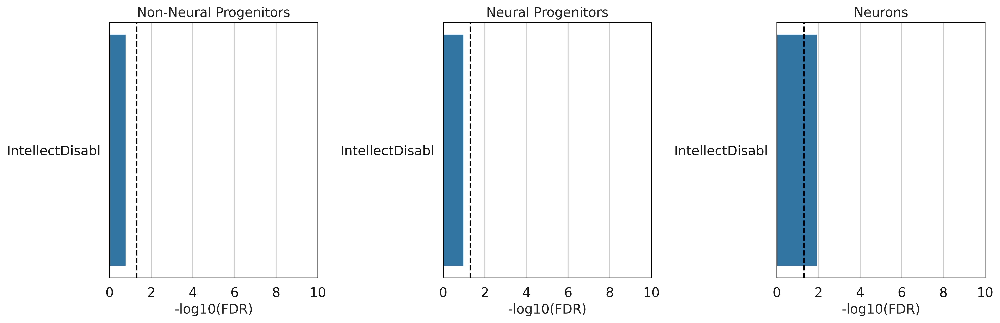

In [52]:
# Plot results
dfs = []
for i, clust in enumerate(test_clust):
    df = tests[i]
    df['qval'] = -np.log10(df['qval'])
    df = df.replace(np.inf, 100)
    dfs += [df]


plt.rcParams.update({'figure.autolayout': True})
fig,axlist = plt.subplots(1,3, figsize=(15, 5))
for i, ax in enumerate(axlist.flatten().tolist()):
    if i == len(test_clust):
        break

    sns.barplot(x='qval', y='set', data=dfs[i], ax=ax)
    ax.set_xlim([0.0, 10.0])
    ax.axvline(x=1.3010299956639813, color='black', linestyle='--')
    ax.set_xlabel('-log10(FDR)')
    ax.set_ylabel(None)
    ax.set_title(test_clust[i])

plt.savefig(sc.settings.figdir / 'enrichment_intdis_hps_three_DEfilt.png',dpi=300, bbox_inches="tight")

### CL3 Permutation Tests

In [53]:
intdisability = de.enrich.RefSets()
intdisability.add(id='IntellectDisabl', source='c.c.', gene_ids=intdis.sets[0].genes)

crossdisorder = de.enrich.RefSets()
crossdisorder.add(id='CrossDisorder', source='c.c.', gene_ids=crossdis.sets[0].genes)

In [54]:
for stepsize in [(100,'random-sampling'), (20,'quintiles-sampling')]: #run permutations for both quintiles binning and random sampling
    for grp in mastde_hps_louvain_three.keys():
        sigpool = mastde_hps_louvain_three[grp][mastde_hps_louvain_three[grp]['qval'] <= 0.05]
        nonsigpool = mastde_hps_louvain_three[grp][mastde_hps_louvain_three[grp]['qval'] > 0.05]

        # get cutoffs for quantiles from significant DE genes
        quantiles = {}
        quantiles["vals"] = [0.0]
        quantiles["vals"] += [sigpool.quantile(i/100)["meanExpr"] for i in range(0,101,stepsize[0])][1:]

        # get number of genes per quantile
        quantiles['n'] = []
        for i in range(len(quantiles['vals'])-1):
            quantiles['n'].append(len(sigpool[(sigpool["meanExpr"] > quantiles['vals'][i]) & (sigpool["meanExpr"] <= quantiles['vals'][i+1])]['gene'].tolist()))

        # sample same binned distribution and number of genes from non-significant pool
        decdf = pd.DataFrame()

        for j in range(1000):
            declist = []
            for i in range(len(quantiles['n'])):
                declist += nonsigpool[(nonsigpool["meanExpr"] > quantiles['vals'][i]) & (nonsigpool["meanExpr"] <= quantiles['vals'][i+1])]['gene'].sample(n=quantiles['n'][i]).tolist()
            decdf[j] = declist

        # perform enrichment tests
        for refset in [intdisability, crossdisorder]:
            dectests = pd.DataFrame(columns=['set', 'pval', 'intersection', 'reference', 'enquiry', 'background'])
            for i in range(decdf.shape[1]):
                dectests = dectests.append(de.enrich.test(ref=refset, gene_ids=decdf[i].tolist(), scores=[0.0 for j in range(len(sigpool))], threshold=1.0, all_ids=mastde_hps_louvain_three[grp]['gene'].tolist()).summary(), ignore_index=True)

            # write to file
            writer = pd.ExcelWriter(f'./enrichment/permutationtests_threegroups_hps_DEfilt-{stepsize[1]}_{refset.sets[0].id}_{grp}.xlsx', engine='xlsxwriter')
            decdf.to_excel(writer,sheet_name="lists")
            dectests.sort_values("pval").to_excel(writer,sheet_name="results")
            writer.save()

INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) and provided gene list (26128).
INFO:diffxpy: 216 overlaps found between refset (217) 

In [55]:
adata_hps.write('./adata_hps.h5ad')